# **Importing the data and needed libraries**

In [ ]:
# Import libraries
import pandas as pd
import calendar
import io
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')

In [ ]:
# Import the Cyclist.csv file

from google.colab import files
files.upload()

Saving Cyclists.csv to Cyclists.csv


{'Cyclists.csv': b'X,Y,Index_,ACCNUM,YEAR,DATE,TIME,HOUR,STREET1,STREET2,OFFSET,ROAD_CLASS,District,WardNum,Division,LATITUDE,LONGITUDE,LOCCOORD,ACCLOC,TRAFFCTL,VISIBILITY,LIGHT,RDSFCOND,ACCLASS,IMPACTYPE,INVTYPE,INVAGE,INJURY,FATAL_NO,INITDIR,VEHTYPE,MANOEUVER,DRIVACT,DRIVCOND,PEDTYPE,PEDACT,PEDCOND,CYCLISTYPE,CYCACT,CYCCOND,PEDESTRIAN,CYCLIST,AUTOMOBILE,MOTORCYCLE,TRUCK,TRSN_CITY_VEH,EMERG_VEH,PASSENGER,SPEEDING,AG_DRIV,REDLIGHT,ALCOHOL,DISABILITY,Hood_ID,Neighbourhood,ObjectId\r\n-8830573.341,5427258.292,3383485,891027,2006,2006/02/11 05:00:00+00,1804,18,UNDERHILL DR,CASSANDRA BLVD,,Collector,North York,16,33,43.752745,-79.32639,Intersection,At Intersection,No Control,Clear,Dark,Dry,Non-Fatal Injury,Cyclist Collisions,Driver,65 to 69,None,,North,"Automobile, Station Wagon",Turning Left,Improper Turn,Inattentive,,,,,,,,Yes,Yes,,,,,,,,,,,45,Parkwoods-Donalda (45),1\r\n-8830573.341,5427258.292,3383486,891027,2006,2006/02/11 05:00:00+00,1804,18,UNDERHILL DR,CASSANDRA BLVD,,Collector,Nor

In [ ]:
# Import cyclist collision data (2006-2019)
cycle = pd.read_csv('Cyclists.csv', sep=',', error_bad_lines=False, encoding="latin-1")

# **Data Exploration**

In [ ]:
cycle.head()

,X,Y,Index_,ACCNUM,YEAR,DATE,TIME,HOUR,STREET1,STREET2,OFFSET,ROAD_CLASS,District,WardNum,Division,LATITUDE,LONGITUDE,LOCCOORD,ACCLOC,TRAFFCTL,VISIBILITY,LIGHT,RDSFCOND,ACCLASS,IMPACTYPE,INVTYPE,INVAGE,INJURY,FATAL_NO,INITDIR,VEHTYPE,MANOEUVER,DRIVACT,DRIVCOND,PEDTYPE,PEDACT,PEDCOND,CYCLISTYPE,CYCACT,CYCCOND,PEDESTRIAN,CYCLIST,AUTOMOBILE,MOTORCYCLE,TRUCK,TRSN_CITY_VEH,EMERG_VEH,PASSENGER,SPEEDING,AG_DRIV,REDLIGHT,ALCOHOL,DISABILITY,Hood_ID,Neighbourhood,ObjectId
0,-8830573.341,5427258.292,3383485,891027,2006,2006/02/11 05:00:00+00,1804,18,UNDERHILL DR,CASSANDRA BLVD,NaN,Collector,North York,16.0,33,43.752745,-79.32639,Intersection,At Intersection,No Control,Clear,Dark,Dry,Non-Fatal Injury,Cyclist Collisions,Driver,65 to 69,None,NaN,North,"Automobile, Station Wagon",Turning Left,Improper Turn,Inattentive,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Yes,Yes,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,45,Parkwoods-Donalda (45),1
1,-8830573.341,5427258.292,3383486,891027,2006,2006/02/11 05:00:00+00,1804,18,UNDERHILL DR,CASSANDRA BLVD,NaN,Collector,North York,16.0,33,43.752745,-79.32639,Intersection,At Intersection,No Control,Clear,Dark,Dry,Non-Fatal Injury,Cyclist Collisions,Cyclist,20 to 24,Major,NaN,South,Bicycle,Going Ahead,NaN,NaN,NaN,NaN,NaN,Motorist turned left across cyclists path.,NaN,NaN,NaN,Yes,Yes,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,45,Parkwoods-Donalda (45),2
2,-8815044.272,5430017.300,3390109,893580,2006,2006/02/27 05:00:00+00,1955,19,MORNINGSIDE AVE,KINGSTON RD,NaN,Major Arterial,Scarborough,NaN,43,43.770645,-79.18689,Intersection,NaN,Traffic Signal,Clear,Dark,Wet,Non-Fatal Injury,Cyclist Collisions,Vehicle Owner,unknown,NaN,NaN,NaN,Other,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Yes,NaN,NaN,NaN,Yes,NaN,NaN,NaN,Yes,NaN,NaN,NaN,136,West Hill (136),3
3,-8815044.272,5430017.300,3390110,893580,2006,2006/02/27 05:00:00+00,1955,19,MORNINGSIDE AVE,KINGSTON RD,NaN,Major Arterial,Scarborough,NaN,43,43.770645,-79.18689,Intersection,NaN,Traffic Signal,Clear,Dark,Wet,Non-Fatal Injury,Cyclist Collisions,Driver,35 to 39,None,NaN,South,Municipal Transit Bus (TTC),Turning Right,Failed to Yield Right of Way,Inattentive,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Yes,NaN,NaN,NaN,Yes,NaN,NaN,NaN,Yes,NaN,NaN,NaN,136,West Hill (136),4
4,-8815044.272,5430017.300,3390111,893580,2006,2006/02/27 05:00:00+00,1955,19,MORNINGSIDE AVE,KINGSTON RD,NaN,Major Arterial,Scarborough,NaN,43,43.770645,-79.18689,Intersection,NaN,Traffic Signal,Clear,Dark,Wet,Non-Fatal Injury,Cyclist Collisions,Cyclist,25 to 29,Major,NaN,West,Bicycle,Going Ahead,NaN,NaN,NaN,NaN,NaN,Motorist turning right on green or amber at si...,Driving Properly,Normal,NaN,Yes,NaN,NaN,NaN,Yes,NaN,NaN,NaN,Yes,NaN,NaN,NaN,136,West Hill (136),5


In [ ]:
# View shape of the dataset
cycle.shape

(1681, 56)

In [ ]:
#Getting more descriptive information about the dataset such as:
#  - Number of rows
#  - Attribute names, here each attribute is represented as a column of data
#  - Data types of attributes
#  - Order of attributes
cycle.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1681 entries, 0 to 1680
Data columns (total 56 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   X              1681 non-null   float64
 1   Y              1681 non-null   float64
 2   Index_         1681 non-null   int64  
 3   ACCNUM         1681 non-null   int64  
 4   YEAR           1681 non-null   int64  
 5   DATE           1681 non-null   object 
 6   TIME           1681 non-null   int64  
 7   HOUR           1681 non-null   int64  
 8   STREET1        1681 non-null   object 
 9   STREET2        1531 non-null   object 
 10  OFFSET         221 non-null    object 
 11  ROAD_CLASS     1681 non-null   object 
 12  District       1679 non-null   object 
 13  WardNum        1460 non-null   float64
 14  Division       1681 non-null   int64  
 15  LATITUDE       1681 non-null   float64
 16  LONGITUDE      1681 non-null   float64
 17  LOCCOORD       1671 non-null   object 
 18  ACCLOC  

In [ ]:
# Identify columns with null values
cycle.isna().sum()

X                   0
Y                   0
Index_              0
ACCNUM              0
YEAR                0
DATE                0
TIME                0
HOUR                0
STREET1             0
STREET2           150
OFFSET           1460
ROAD_CLASS          0
District            2
WardNum           221
Division            0
LATITUDE            0
LONGITUDE           0
LOCCOORD           10
ACCLOC            494
TRAFFCTL            0
VISIBILITY          0
LIGHT               0
RDSFCOND            0
ACCLASS             0
IMPACTYPE           0
INVTYPE             0
INVAGE              0
INJURY            150
FATAL_NO         1650
INITDIR           254
VEHTYPE           105
MANOEUVER         261
DRIVACT           961
DRIVCOND          963
PEDTYPE          1665
PEDACT           1665
PEDCOND          1665
CYCLISTYPE       1040
CYCACT           1015
CYCCOND          1016
PEDESTRIAN       1648
CYCLIST             0
AUTOMOBILE        262
MOTORCYCLE       1675
TRUCK            1566
TRSN_CITY_

In [ ]:
# write down just the column names of dataset
print(cycle.columns)

Index(['X', 'Y', 'Index_', 'ACCNUM', 'YEAR', 'DATE', 'TIME', 'HOUR', 'STREET1',
       'STREET2', 'OFFSET', 'ROAD_CLASS', 'District', 'WardNum', 'Division',
       'LATITUDE', 'LONGITUDE', 'LOCCOORD', 'ACCLOC', 'TRAFFCTL', 'VISIBILITY',
       'LIGHT', 'RDSFCOND', 'ACCLASS', 'IMPACTYPE', 'INVTYPE', 'INVAGE',
       'INJURY', 'FATAL_NO', 'INITDIR', 'VEHTYPE', 'MANOEUVER', 'DRIVACT',
       'DRIVCOND', 'PEDTYPE', 'PEDACT', 'PEDCOND', 'CYCLISTYPE', 'CYCACT',
       'CYCCOND', 'PEDESTRIAN', 'CYCLIST', 'AUTOMOBILE', 'MOTORCYCLE', 'TRUCK',
       'TRSN_CITY_VEH', 'EMERG_VEH', 'PASSENGER', 'SPEEDING', 'AG_DRIV',
       'REDLIGHT', 'ALCOHOL', 'DISABILITY', 'Hood_ID', 'Neighbourhood',
       'ObjectId'],
      dtype='object')


In [ ]:
#Exploring some additional information about the data set so as to determine which of the columns will be most useful for our project
cycle.describe()

,X,Y,Index_,ACCNUM,YEAR,TIME,HOUR,WardNum,Division,LATITUDE,LONGITUDE,FATAL_NO,DISABILITY,Hood_ID,ObjectId
count,1.681000e+03,1.681000e+03,1.681000e+03,1.681000e+03,1681.000000,1681.000000,1681.000000,1460.000000,1681.000000,1681.000000,1681.000000,31.000000,0.0,1681.000000,1681.000000
mean,-8.837875e+06,5.417215e+06,3.361974e+07,2.337443e+09,2012.253421,1431.539560,14.090422,11.842466,35.280785,43.687522,-79.391980,34.838710,NaN,78.220107,841.000000
std,8.739603e+03,7.513729e+03,3.605374e+07,3.216098e+09,3.802571,550.416838,5.387721,5.658415,17.096182,0.048785,0.078509,12.827306,NaN,30.181934,485.407217
min,-8.862052e+06,5.403919e+06,3.383485e+06,8.910270e+05,2006.000000,0.000000,0.000000,1.000000,11.000000,43.601107,-79.609165,10.000000,NaN,1.000000,1.000000
25%,-8.842663e+06,5.411983e+06,5.792650e+06,1.135987e+06,2009.000000,1019.000000,10.000000,9.000000,14.000000,43.653545,-79.434990,25.500000,NaN,69.000000,421.000000
50%,-8.838276e+06,5.414337e+06,7.523090e+06,1.324513e+06,2012.000000,1525.000000,15.000000,11.000000,41.000000,43.668845,-79.395587,32.000000,NaN,78.000000,841.000000
75%,-8.833068e+06,5.420572e+06,8.049742e+07,5.001723e+09,2015.000000,1842.000000,18.000000,14.000000,52.000000,43.709345,-79.348804,41.000000,NaN,94.000000,1261.000000
max,-8.809770e+06,5.439040e+06,8.134072e+07,9.002411e+09,2019.000000,2359.000000,23.000000,25.000000,55.000000,43.829145,-79.139507,60.000000,NaN,139.000000,1681.000000


# **Data Cleaning**

In [ ]:
# Drop unwanted columns either due to lack of relevance for our desired analysis or high null values
cycle = cycle.drop(["X", "Y", "Index_", "ACCNUM", "ObjectId", "Hood_ID", "OFFSET", 'WardNum','DISABILITY','PEDTYPE','PEDACT',
'PEDCOND','PASSENGER','FATAL_NO','CYCLIST','CYCLISTYPE','DRIVCOND', 'STREET1','STREET2','INITDIR','CYCACT','CYCCOND'], axis=1)

In [ ]:
# Add new column to identify COLLISION occurrences for when the tables are merged
cycle['Incident Type'] = pd.Series(['COLLISION' for x in range(len(cycle.index))], index=cycle.index)

In [ ]:
cycle.head()

,YEAR,DATE,TIME,HOUR,ROAD_CLASS,District,Division,LATITUDE,LONGITUDE,LOCCOORD,ACCLOC,TRAFFCTL,VISIBILITY,LIGHT,RDSFCOND,ACCLASS,IMPACTYPE,INVTYPE,INVAGE,INJURY,VEHTYPE,MANOEUVER,DRIVACT,PEDESTRIAN,AUTOMOBILE,MOTORCYCLE,TRUCK,TRSN_CITY_VEH,EMERG_VEH,SPEEDING,AG_DRIV,REDLIGHT,ALCOHOL,Neighbourhood,Incident Type
0,2006,2006/02/11 05:00:00+00,1804,18,Collector,North York,33,43.752745,-79.32639,Intersection,At Intersection,No Control,Clear,Dark,Dry,Non-Fatal Injury,Cyclist Collisions,Driver,65 to 69,None,"Automobile, Station Wagon",Turning Left,Improper Turn,NaN,Yes,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Parkwoods-Donalda (45),COLLISION
1,2006,2006/02/11 05:00:00+00,1804,18,Collector,North York,33,43.752745,-79.32639,Intersection,At Intersection,No Control,Clear,Dark,Dry,Non-Fatal Injury,Cyclist Collisions,Cyclist,20 to 24,Major,Bicycle,Going Ahead,NaN,NaN,Yes,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Parkwoods-Donalda (45),COLLISION
2,2006,2006/02/27 05:00:00+00,1955,19,Major Arterial,Scarborough,43,43.770645,-79.18689,Intersection,NaN,Traffic Signal,Clear,Dark,Wet,Non-Fatal Injury,Cyclist Collisions,Vehicle Owner,unknown,NaN,Other,NaN,NaN,NaN,NaN,NaN,NaN,Yes,NaN,NaN,Yes,NaN,NaN,West Hill (136),COLLISION
3,2006,2006/02/27 05:00:00+00,1955,19,Major Arterial,Scarborough,43,43.770645,-79.18689,Intersection,NaN,Traffic Signal,Clear,Dark,Wet,Non-Fatal Injury,Cyclist Collisions,Driver,35 to 39,None,Municipal Transit Bus (TTC),Turning Right,Failed to Yield Right of Way,NaN,NaN,NaN,NaN,Yes,NaN,NaN,Yes,NaN,NaN,West Hill (136),COLLISION
4,2006,2006/02/27 05:00:00+00,1955,19,Major Arterial,Scarborough,43,43.770645,-79.18689,Intersection,NaN,Traffic Signal,Clear,Dark,Wet,Non-Fatal Injury,Cyclist Collisions,Cyclist,25 to 29,Major,Bicycle,Going Ahead,NaN,NaN,NaN,NaN,NaN,Yes,NaN,NaN,Yes,NaN,NaN,West Hill (136),COLLISION


In [ ]:
# Check if vehicle types and automobiles appear exclusively or share 'Yes'
# New column for vehicle type will be created; this is required to fill in fields
# If Yes appears in multiple columns then AUTOMOBILE will refer to all other vehicles in the new 'Vehicle Type' column that will be created 
cycle.loc[(cycle['MOTORCYCLE']=='Yes') & (cycle['AUTOMOBILE']=='Yes')]

,YEAR,DATE,TIME,HOUR,ROAD_CLASS,District,Division,LATITUDE,LONGITUDE,LOCCOORD,ACCLOC,TRAFFCTL,VISIBILITY,LIGHT,RDSFCOND,ACCLASS,IMPACTYPE,INVTYPE,INVAGE,INJURY,VEHTYPE,MANOEUVER,DRIVACT,PEDESTRIAN,AUTOMOBILE,MOTORCYCLE,TRUCK,TRSN_CITY_VEH,EMERG_VEH,SPEEDING,AG_DRIV,REDLIGHT,ALCOHOL,Neighbourhood,Incident Type


In [ ]:
cycle.loc[(cycle['TRUCK']=='Yes') & (cycle['AUTOMOBILE']=='Yes')]

,YEAR,DATE,TIME,HOUR,ROAD_CLASS,District,Division,LATITUDE,LONGITUDE,LOCCOORD,ACCLOC,TRAFFCTL,VISIBILITY,LIGHT,RDSFCOND,ACCLASS,IMPACTYPE,INVTYPE,INVAGE,INJURY,VEHTYPE,MANOEUVER,DRIVACT,PEDESTRIAN,AUTOMOBILE,MOTORCYCLE,TRUCK,TRSN_CITY_VEH,EMERG_VEH,SPEEDING,AG_DRIV,REDLIGHT,ALCOHOL,Neighbourhood,Incident Type
572,2011,2011/11/25 05:00:00+00,958,9,Major Arterial,Toronto and East York,51,43.651645,-79.37899,Intersection,At Intersection,Traffic Signal,Clear,Daylight,Dry,Non-Fatal Injury,Cyclist Collisions,Vehicle Owner,unknown,NaN,Other,NaN,NaN,NaN,Yes,NaN,Yes,NaN,NaN,NaN,NaN,NaN,NaN,Church-Yonge Corridor (75),COLLISION
573,2011,2011/11/25 05:00:00+00,958,9,Major Arterial,Toronto and East York,51,43.651645,-79.37899,Intersection,At Intersection,Traffic Signal,Clear,Daylight,Dry,Non-Fatal Injury,Cyclist Collisions,Truck Driver,35 to 39,None,Truck - Open,Going Ahead,Driving Properly,NaN,Yes,NaN,Yes,NaN,NaN,NaN,NaN,NaN,NaN,Church-Yonge Corridor (75),COLLISION
574,2011,2011/11/25 05:00:00+00,958,9,Major Arterial,Toronto and East York,51,43.651645,-79.37899,Intersection,At Intersection,Traffic Signal,Clear,Daylight,Dry,Non-Fatal Injury,Cyclist Collisions,Vehicle Owner,unknown,NaN,Other,NaN,NaN,NaN,Yes,NaN,Yes,NaN,NaN,NaN,NaN,NaN,NaN,Church-Yonge Corridor (75),COLLISION
575,2011,2011/11/25 05:00:00+00,958,9,Major Arterial,Toronto and East York,51,43.651645,-79.37899,Intersection,At Intersection,Traffic Signal,Clear,Daylight,Dry,Non-Fatal Injury,Cyclist Collisions,Driver,55 to 59,None,"Automobile, Station Wagon",Going Ahead,Driving Properly,NaN,Yes,NaN,Yes,NaN,NaN,NaN,NaN,NaN,NaN,Church-Yonge Corridor (75),COLLISION
576,2011,2011/11/25 05:00:00+00,958,9,Major Arterial,Toronto and East York,51,43.651645,-79.37899,Intersection,At Intersection,Traffic Signal,Clear,Daylight,Dry,Non-Fatal Injury,Cyclist Collisions,Cyclist,30 to 34,Major,Bicycle,Going Ahead,NaN,NaN,Yes,NaN,Yes,NaN,NaN,NaN,NaN,NaN,NaN,Church-Yonge Corridor (75),COLLISION
669,2007,2007/06/08 04:00:00+00,809,8,Major Arterial,North York,33,43.760445,-79.38659,Intersection,At Intersection,No Control,Clear,Daylight,Dry,Fatal,Cyclist Collisions,Vehicle Owner,unknown,NaN,Other,NaN,NaN,NaN,Yes,NaN,Yes,NaN,NaN,NaN,NaN,NaN,NaN,St.Andrew-Windfields (40),COLLISION
670,2007,2007/06/08 04:00:00+00,809,8,Major Arterial,North York,33,43.760445,-79.38659,Intersection,At Intersection,No Control,Clear,Daylight,Dry,Fatal,Cyclist Collisions,Truck Driver,45 to 49,None,Truck - Open,Going Ahead,Driving Properly,NaN,Yes,NaN,Yes,NaN,NaN,NaN,NaN,NaN,NaN,St.Andrew-Windfields (40),COLLISION
671,2007,2007/06/08 04:00:00+00,809,8,Major Arterial,North York,33,43.760445,-79.38659,Intersection,At Intersection,No Control,Clear,Daylight,Dry,Fatal,Cyclist Collisions,Cyclist,45 to 49,Fatal,Bicycle,Going Ahead,NaN,NaN,Yes,NaN,Yes,NaN,NaN,NaN,NaN,NaN,NaN,St.Andrew-Windfields (40),COLLISION
672,2007,2007/06/08 04:00:00+00,809,8,Major Arterial,North York,33,43.760445,-79.38659,Intersection,At Intersection,No Control,Clear,Daylight,Dry,Fatal,Cyclist Collisions,Driver,35 to 39,None,"Automobile, Station Wagon",Going Ahead,Driving Properly,NaN,Yes,NaN,Yes,NaN,NaN,NaN,NaN,NaN,NaN,St.Andrew-Windfields (40),COLLISION


In [ ]:
cycle.loc[(cycle['TRSN_CITY_VEH']=='Yes') & (cycle['AUTOMOBILE']=='Yes')]

,YEAR,DATE,TIME,HOUR,ROAD_CLASS,District,Division,LATITUDE,LONGITUDE,LOCCOORD,ACCLOC,TRAFFCTL,VISIBILITY,LIGHT,RDSFCOND,ACCLASS,IMPACTYPE,INVTYPE,INVAGE,INJURY,VEHTYPE,MANOEUVER,DRIVACT,PEDESTRIAN,AUTOMOBILE,MOTORCYCLE,TRUCK,TRSN_CITY_VEH,EMERG_VEH,SPEEDING,AG_DRIV,REDLIGHT,ALCOHOL,Neighbourhood,Incident Type
167,2010,2010/05/18 04:00:00+00,1318,13,Major Arterial,Toronto and East York,53,43.672473,-79.395664,Intersection,NaN,No Control,Clear,Daylight,Dry,Non-Fatal Injury,Cyclist Collisions,Driver,50 to 54,None,"Automobile, Station Wagon",Parked,Other,NaN,Yes,NaN,NaN,Yes,NaN,NaN,NaN,NaN,NaN,Annex (95),COLLISION
168,2010,2010/05/18 04:00:00+00,1318,13,Major Arterial,Toronto and East York,53,43.672473,-79.395664,Intersection,NaN,No Control,Clear,Daylight,Dry,Non-Fatal Injury,Cyclist Collisions,Vehicle Owner,unknown,NaN,Other,NaN,NaN,NaN,Yes,NaN,NaN,Yes,NaN,NaN,NaN,NaN,NaN,Annex (95),COLLISION
169,2010,2010/05/18 04:00:00+00,1318,13,Major Arterial,Toronto and East York,53,43.672473,-79.395664,Intersection,NaN,No Control,Clear,Daylight,Dry,Non-Fatal Injury,Cyclist Collisions,Driver,50 to 54,None,Municipal Transit Bus (TTC),Going Ahead,Driving Properly,NaN,Yes,NaN,NaN,Yes,NaN,NaN,NaN,NaN,NaN,Annex (95),COLLISION
170,2010,2010/05/18 04:00:00+00,1318,13,Major Arterial,Toronto and East York,53,43.672473,-79.395664,Intersection,NaN,No Control,Clear,Daylight,Dry,Non-Fatal Injury,Cyclist Collisions,Cyclist,15 to 19,Major,Bicycle,Overtaking,NaN,NaN,Yes,NaN,NaN,Yes,NaN,NaN,NaN,NaN,NaN,Annex (95),COLLISION
830,2007,2007/09/20 04:00:00+00,1825,18,Minor Arterial,Toronto and East York,55,43.663645,-79.328590,Mid-Block,NaN,No Control,Clear,Daylight,Dry,Non-Fatal Injury,Cyclist Collisions,Vehicle Owner,unknown,NaN,Other,NaN,NaN,NaN,Yes,NaN,NaN,Yes,NaN,NaN,NaN,NaN,NaN,South Riverdale (70),COLLISION
831,2007,2007/09/20 04:00:00+00,1825,18,Minor Arterial,Toronto and East York,55,43.663645,-79.328590,Mid-Block,NaN,No Control,Clear,Daylight,Dry,Non-Fatal Injury,Cyclist Collisions,Driver,30 to 34,None,Municipal Transit Bus (TTC),Going Ahead,Driving Properly,NaN,Yes,NaN,NaN,Yes,NaN,NaN,NaN,NaN,NaN,South Riverdale (70),COLLISION
832,2007,2007/09/20 04:00:00+00,1825,18,Minor Arterial,Toronto and East York,55,43.663645,-79.328590,Mid-Block,NaN,No Control,Clear,Daylight,Dry,Non-Fatal Injury,Cyclist Collisions,Driver,60 to 64,None,"Automobile, Station Wagon",Parked,Other,NaN,Yes,NaN,NaN,Yes,NaN,NaN,NaN,NaN,NaN,South Riverdale (70),COLLISION
833,2007,2007/09/20 04:00:00+00,1825,18,Minor Arterial,Toronto and East York,55,43.663645,-79.328590,Mid-Block,NaN,No Control,Clear,Daylight,Dry,Non-Fatal Injury,Cyclist Collisions,Cyclist,30 to 34,Major,Bicycle,Going Ahead,NaN,NaN,Yes,NaN,NaN,Yes,NaN,NaN,NaN,NaN,NaN,South Riverdale (70),COLLISION
1300,2017,2017/10/18 04:00:00+00,906,9,Major Arterial,Toronto and East York,14,43.637950,-79.431827,Intersection,At Intersection,Stop Sign,Clear,Daylight,Dry,Fatal,Cyclist Collisions,Cyclist,35 to 39,Fatal,Bicycle,Going Ahead,NaN,NaN,Yes,NaN,NaN,Yes,NaN,NaN,Yes,NaN,NaN,South Parkdale (85),COLLISION
1301,2017,2017/10/18 04:00:00+00,906,9,Major Arterial,Toronto and East York,14,43.637950,-79.431827,Intersection,At Intersection,Stop Sign,Clear,Daylight,Dry,Fatal,Cyclist Collisions,Driver,25 to 29,None,Pick Up Truck,Going Ahead,Failed to Yield Right of Way,NaN,Yes,NaN,NaN,Yes,NaN,NaN,Yes,NaN,NaN,South Parkdale (85),COLLISION


In [ ]:
cycle.loc[(cycle['EMERG_VEH']=='Yes') & (cycle['AUTOMOBILE']=='Yes')]

,YEAR,DATE,TIME,HOUR,ROAD_CLASS,District,Division,LATITUDE,LONGITUDE,LOCCOORD,ACCLOC,TRAFFCTL,VISIBILITY,LIGHT,RDSFCOND,ACCLASS,IMPACTYPE,INVTYPE,INVAGE,INJURY,VEHTYPE,MANOEUVER,DRIVACT,PEDESTRIAN,AUTOMOBILE,MOTORCYCLE,TRUCK,TRSN_CITY_VEH,EMERG_VEH,SPEEDING,AG_DRIV,REDLIGHT,ALCOHOL,Neighbourhood,Incident Type
319,2008,2008/09/04 04:00:00+00,1450,14,Major Arterial,Toronto and East York,53,43.690043,-79.402889,Mid-Block,NaN,No Control,Clear,Daylight,Dry,Non-Fatal Injury,Cyclist Collisions,Driver,unknown,None,"Automobile, Station Wagon",Changing Lanes,Improper Passing,NaN,Yes,NaN,NaN,NaN,Yes,NaN,Yes,NaN,NaN,Yonge-St.Clair (97),COLLISION
320,2008,2008/09/04 04:00:00+00,1450,14,Major Arterial,Toronto and East York,53,43.690043,-79.402889,Mid-Block,NaN,No Control,Clear,Daylight,Dry,Non-Fatal Injury,Cyclist Collisions,Vehicle Owner,unknown,NaN,NaN,NaN,NaN,NaN,Yes,NaN,NaN,NaN,Yes,NaN,Yes,NaN,NaN,Yonge-St.Clair (97),COLLISION
321,2008,2008/09/04 04:00:00+00,1450,14,Major Arterial,Toronto and East York,53,43.690043,-79.402889,Mid-Block,NaN,No Control,Clear,Daylight,Dry,Non-Fatal Injury,Cyclist Collisions,Cyclist,35 to 39,Major,Police Vehicle,Going Ahead,NaN,NaN,Yes,NaN,NaN,NaN,Yes,NaN,Yes,NaN,NaN,Yonge-St.Clair (97),COLLISION


In [ ]:
# List conditions for new column
conditions = [cycle['AUTOMOBILE'].eq('Yes') & cycle['TRUCK'].isnull() & cycle['MOTORCYCLE'].isnull() 
& cycle['TRSN_CITY_VEH'].isnull() & cycle['EMERG_VEH'].isnull(),
              cycle['TRUCK'].eq('Yes'),
              cycle['MOTORCYCLE'].eq('Yes'),
              cycle['TRSN_CITY_VEH'].eq('Yes'),
              cycle['EMERG_VEH'].eq('Yes')]

In [ ]:
# List vehicle type options for new column
veh_types = ['AUTOMOBILE','TRUCK','MOTORCYCLE','TRANSIT OR CITY VEHICLE', 'EMERGENCY VEHICLE']

In [ ]:
# Create new column
cycle['Vehicle Type'] = np.select(conditions, veh_types, default= cycle['AUTOMOBILE'] )

In [ ]:
cycle.head()

,YEAR,DATE,TIME,HOUR,ROAD_CLASS,District,Division,LATITUDE,LONGITUDE,LOCCOORD,ACCLOC,TRAFFCTL,VISIBILITY,LIGHT,RDSFCOND,ACCLASS,IMPACTYPE,INVTYPE,INVAGE,INJURY,VEHTYPE,MANOEUVER,DRIVACT,PEDESTRIAN,AUTOMOBILE,MOTORCYCLE,TRUCK,TRSN_CITY_VEH,EMERG_VEH,SPEEDING,AG_DRIV,REDLIGHT,ALCOHOL,Neighbourhood,Incident Type,Vehicle Type
0,2006,2006/02/11 05:00:00+00,1804,18,Collector,North York,33,43.752745,-79.32639,Intersection,At Intersection,No Control,Clear,Dark,Dry,Non-Fatal Injury,Cyclist Collisions,Driver,65 to 69,None,"Automobile, Station Wagon",Turning Left,Improper Turn,NaN,Yes,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Parkwoods-Donalda (45),COLLISION,AUTOMOBILE
1,2006,2006/02/11 05:00:00+00,1804,18,Collector,North York,33,43.752745,-79.32639,Intersection,At Intersection,No Control,Clear,Dark,Dry,Non-Fatal Injury,Cyclist Collisions,Cyclist,20 to 24,Major,Bicycle,Going Ahead,NaN,NaN,Yes,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Parkwoods-Donalda (45),COLLISION,AUTOMOBILE
2,2006,2006/02/27 05:00:00+00,1955,19,Major Arterial,Scarborough,43,43.770645,-79.18689,Intersection,NaN,Traffic Signal,Clear,Dark,Wet,Non-Fatal Injury,Cyclist Collisions,Vehicle Owner,unknown,NaN,Other,NaN,NaN,NaN,NaN,NaN,NaN,Yes,NaN,NaN,Yes,NaN,NaN,West Hill (136),COLLISION,TRANSIT OR CITY VEHICLE
3,2006,2006/02/27 05:00:00+00,1955,19,Major Arterial,Scarborough,43,43.770645,-79.18689,Intersection,NaN,Traffic Signal,Clear,Dark,Wet,Non-Fatal Injury,Cyclist Collisions,Driver,35 to 39,None,Municipal Transit Bus (TTC),Turning Right,Failed to Yield Right of Way,NaN,NaN,NaN,NaN,Yes,NaN,NaN,Yes,NaN,NaN,West Hill (136),COLLISION,TRANSIT OR CITY VEHICLE
4,2006,2006/02/27 05:00:00+00,1955,19,Major Arterial,Scarborough,43,43.770645,-79.18689,Intersection,NaN,Traffic Signal,Clear,Dark,Wet,Non-Fatal Injury,Cyclist Collisions,Cyclist,25 to 29,Major,Bicycle,Going Ahead,NaN,NaN,NaN,NaN,NaN,Yes,NaN,NaN,Yes,NaN,NaN,West Hill (136),COLLISION,TRANSIT OR CITY VEHICLE


In [ ]:
# Check to see if total value counts and null equal total number of rows (1681)
cycle['Vehicle Type'].value_counts()

AUTOMOBILE                 1393
TRUCK                       115
TRANSIT OR CITY VEHICLE      78
MOTORCYCLE                    6
EMERGENCY VEHICLE             5
Name: Vehicle Type, dtype: int64

In [ ]:
cycle['Vehicle Type'].isna().sum()

84

In [ ]:
cycle['Vehicle Type'].value_counts().sum() + cycle['Vehicle Type'].isna().sum()

1681

In [ ]:
# Drop vehicle columns from 'cycle' dataframe as they are no longer needed
cycle = cycle.drop(['AUTOMOBILE', 'MOTORCYCLE', 'TRUCK', 'TRSN_CITY_VEH', 'EMERG_VEH'], axis=1)

In [ ]:
# Value counts of columns containing "Yes" or NaN and fill NaN with 'No'
cycle.groupby(['Incident Type']).agg({'REDLIGHT': 'value_counts', 'ALCOHOL': 'value_counts', 'SPEEDING': 'value_counts', 
                                      'AG_DRIV': 'value_counts', 'PEDESTRIAN':'value_counts' })

,,REDLIGHT,ALCOHOL,SPEEDING,AG_DRIV,PEDESTRIAN
Incident Type,REDLIGHT,,,,,
COLLISION,Yes,56,21,51,605,33


In [ ]:
cycle= cycle.fillna({'REDLIGHT': 'No', 'ALCOHOL': 'No', 'SPEEDING':'No', 'AG_DRIV':'No', 'PEDESTRIAN':'No'})

In [ ]:
cycle.head(1)

,YEAR,DATE,TIME,HOUR,ROAD_CLASS,District,Division,LATITUDE,LONGITUDE,LOCCOORD,ACCLOC,TRAFFCTL,VISIBILITY,LIGHT,RDSFCOND,ACCLASS,IMPACTYPE,INVTYPE,INVAGE,INJURY,VEHTYPE,MANOEUVER,DRIVACT,PEDESTRIAN,SPEEDING,AG_DRIV,REDLIGHT,ALCOHOL,Neighbourhood,Incident Type,Vehicle Type
0,2006,2006/02/11 05:00:00+00,1804,18,Collector,North York,33,43.752745,-79.32639,Intersection,At Intersection,No Control,Clear,Dark,Dry,Non-Fatal Injury,Cyclist Collisions,Driver,65 to 69,None,"Automobile, Station Wagon",Turning Left,Improper Turn,No,No,No,No,No,Parkwoods-Donalda (45),COLLISION,AUTOMOBILE


In [ ]:
# Looking at the columns in detail after cleanup 
print(cycle.columns)

Index(['YEAR', 'DATE', 'TIME', 'HOUR', 'ROAD_CLASS', 'District', 'Division',
       'LATITUDE', 'LONGITUDE', 'LOCCOORD', 'ACCLOC', 'TRAFFCTL', 'VISIBILITY',
       'LIGHT', 'RDSFCOND', 'ACCLASS', 'IMPACTYPE', 'INVTYPE', 'INVAGE',
       'INJURY', 'VEHTYPE', 'MANOEUVER', 'DRIVACT', 'PEDESTRIAN', 'SPEEDING',
       'AG_DRIV', 'REDLIGHT', 'ALCOHOL', 'Neighbourhood', 'Incident Type',
       'Vehicle Type'],
      dtype='object')


In [ ]:
# Value Counts for other various columns of interest
cycle['ROAD_CLASS'].value_counts()

Major Arterial    1106
Minor Arterial     361
Collector          116
Local               98
Name: ROAD_CLASS, dtype: int64

In [ ]:
#DATE: change dtype of DATE to DateTime dtype and create a Month column for clear analysis 
cycle.DATE = pd.to_datetime(cycle.DATE)
cycle.DATE = cycle.DATE.dt.date
cycle['DATE'] = pd.to_datetime(cycle['DATE'])
cycle['MONTH'] = cycle['DATE'].map(lambda x:x.month)
cycle['DATE'].dtype

dtype('<M8[ns]')

In [ ]:
cycle[['DATE','YEAR','MONTH', 'HOUR']].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1681 entries, 0 to 1680
Data columns (total 4 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   DATE    1681 non-null   datetime64[ns]
 1   YEAR    1681 non-null   int64         
 2   MONTH   1681 non-null   int64         
 3   HOUR    1681 non-null   int64         
dtypes: datetime64[ns](1), int64(3)
memory usage: 52.7 KB


In [ ]:
cycle[['DATE','YEAR','MONTH','HOUR']].head()

,DATE,YEAR,MONTH,HOUR
0,2006-02-11,2006,2,18
1,2006-02-11,2006,2,18
2,2006-02-27,2006,2,19
3,2006-02-27,2006,2,19
4,2006-02-27,2006,2,19


In [ ]:
cycle[['DATE','YEAR','MONTH', 'HOUR']].tail()

,DATE,YEAR,MONTH,HOUR
1676,2018-11-29,2018,11,17
1677,2018-11-29,2018,11,17
1678,2018-12-07,2018,12,3
1679,2018-12-07,2018,12,3
1680,2019-03-18,2019,3,20


In [ ]:
# Add a day column to analyze the days in which collisions occurred
cycle['DAY'] = cycle['DATE'].dt.day_name()

In [ ]:
cycle[['DATE','DAY','YEAR','MONTH','HOUR']].head()

,DATE,DAY,YEAR,MONTH,HOUR
0,2006-02-11,Saturday,2006,2,18
1,2006-02-11,Saturday,2006,2,18
2,2006-02-27,Monday,2006,2,19
3,2006-02-27,Monday,2006,2,19
4,2006-02-27,Monday,2006,2,19


In [ ]:
#Understanding the Vehicle Manouever when the accident occured. 

cycle['MANOEUVER'].value_counts()

Going Ahead                            870
Turning Left                           188
Turning Right                          124
Parked                                  46
Stopped                                 43
Overtaking                              42
Changing Lanes                          38
Unknown                                 14
Slowing or Stopping                     14
Other                                   11
Making U Turn                           10
Merging                                  6
Reversing                                6
Pulling Onto Shoulder or towardCurb      5
Pulling Away from Shoulder or Curb       3
Name: MANOEUVER, dtype: int64

In [ ]:
#Understanding the Severity of Injury

cycle['INJURY'].value_counts()

None       766
Major      678
Fatal       37
Minimal     32
Minor       18
Name: INJURY, dtype: int64

In [ ]:
#Understanding where in the Police Division the accidents happened 

cycle['Division'].value_counts()

14    254
52    180
51    153
53    145
55    118
11    115
42     95
41     86
13     82
54     77
22     63
12     59
32     58
33     57
31     50
43     49
23     40
Name: Division, dtype: int64

In [ ]:
#Understanding where in the Location Coordinate (LOCCOORD) the accidents happened. 

cycle['LOCCOORD'].value_counts()

Intersection    1231
Mid-Block        440
Name: LOCCOORD, dtype: int64

In [ ]:
#Diving deeper to the Accident Location (ACCLOC) of where the accidents happened 

cycle['ACCLOC'].value_counts()

At Intersection          888
Non Intersection         149
Intersection Related     101
At/Near Private Drive     47
Laneway                    2
Name: ACCLOC, dtype: int64

In [ ]:
#Checking what were the Road Surface Conditions (RDSFCOND) when the accidents happened. 

cycle['RDSFCOND'].value_counts()

Dry           1502
Wet            171
Other            4
Loose Snow       4
Name: RDSFCOND, dtype: int64

In [ ]:
#Checking in which neighbourhoods in Toronto majority of the accidents happened.

cycle['Neighbourhood'].value_counts()

Waterfront Communities-The Island (77)    93
Bay Street Corridor (76)                  85
South Riverdale (70)                      61
Church-Yonge Corridor (75)                59
Dufferin Grove (83)                       57
                                          ..
Westminster-Branson (35)                   2
Mount Dennis (115)                         2
Princess-Rosethorn (10)                    2
Alderwood (20)                             1
Bathurst Manor (34)                        1
Name: Neighbourhood, Length: 124, dtype: int64

# **Visualization**

Text(0, 10, 'Collisions peak in 2012-2013 and then they trend down until 2019.\n Perhaps there were awareness programs or new measures put in place to emphasize cyclist safety.')

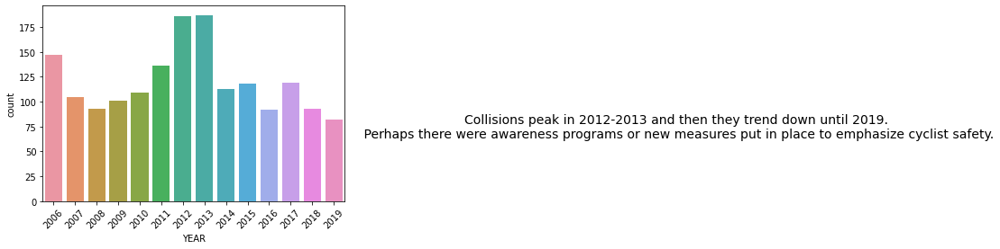

In [ ]:
# Plot number of cyclist collisions each year
sns.countplot(x='YEAR', data=cycle)
plt.xticks(rotation=45)
plt.annotate('Collisions peak in 2012-2013 and then they trend down until 2019.' 
             '\n Perhaps there were awareness programs or new measures put in place to emphasize cyclist safety.',
             xy=(2.1, 0.4), xytext=(0, 10),
             xycoords=('axes fraction', 'figure fraction'),
             textcoords='offset points',
             size=14, ha='center', va='bottom')

Text(0, 10, 'June has the highest number of collisions, followed by September. \n The summer months are when most collisions occur likely due to warm weather increasing the number cyclists. \nThe high number in June could be caused by the end of the school year increasing the number of cyclist traffic, \nThe high count in September could be due to the return to school causing more vehicles and bikes on the road.')

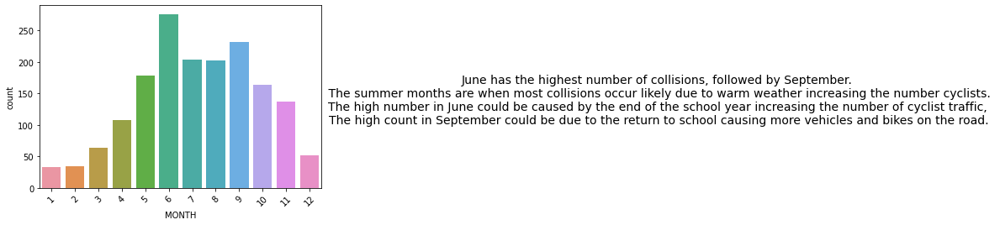

In [ ]:
# Plot number of cyclist collisions each month
sns.countplot(x='MONTH', data=cycle)
plt.xticks(rotation=45)
plt.annotate('June has the highest number of collisions, followed by September. \n ' 
             'The summer months are when most collisions occur likely due to warm weather increasing the number cyclists. \n' 
             'The high number in June could be caused by the end of the school year increasing the number of cyclist traffic, \n' 
             'The high count in September could be due to the return to school causing more vehicles and bikes on the road.', 
             xy=(2.2, 0.4), xytext=(0, 10),
             xycoords=('axes fraction', 'figure fraction'),
             textcoords='offset points',
             size=14, ha='center', va='bottom')

Text(0, 10, 'Collisions are highest during evening rush hour (5-7PM), likely due to the increased traffic at this time')

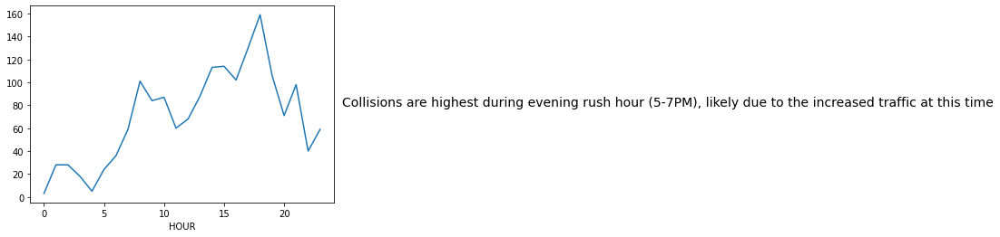

In [ ]:
# Plot number of collisions based on hour of the day
cycle.groupby('HOUR').size().plot(kind='line')
plt.annotate('Collisions are highest during evening rush hour (5-7PM), likely due to the increased traffic at this time',
             xy=(2.1, 0.5), xytext=(0, 10),
             xycoords=('axes fraction', 'figure fraction'),
             textcoords='offset points',
             size=14, ha='center', va='bottom')

Text(0, 10, 'The vast majority of accidents are non-fatal. Toronto generally has lower speed limits and high congestion which \ndecreases the speed of impact and thus decreases the chance of a fatality')

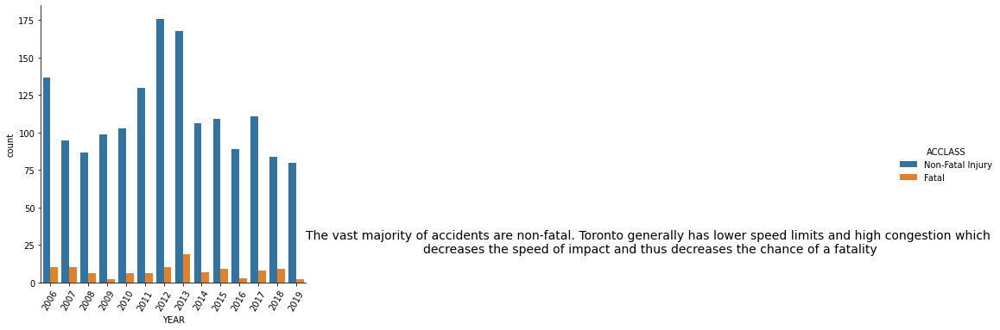

In [ ]:
#Categorizing Fatal vs. non-Fatal Incident 

sns.catplot(x='YEAR', kind='count', data=cycle,  hue='ACCLASS')
plt.xticks(rotation=60)
plt.annotate('The vast majority of accidents are non-fatal. Toronto generally has lower speed limits and high congestion which \n' 
             'decreases the speed of impact and thus decreases the chance of a fatality',
             xy=(2.3, 0.2), xytext=(0, 10),
             xycoords=('axes fraction', 'figure fraction'),
             textcoords='offset points',
             size=14, ha='center', va='bottom')

Text(0, 10, 'Most collisions occur without any traffic control, however traffic signals are also very common areas of impact. \nThis may signify a lack of relevance for traffic control as a factor in cyclist collisions. \nOr lack of awareness on who has the right of way in cases where there is no traffic control.')

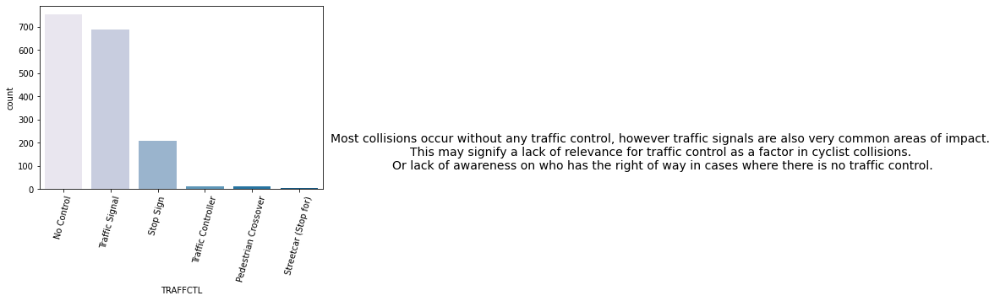

In [ ]:
# Plot traffic control in areas of collision
sns.countplot(x='TRAFFCTL', data=cycle, palette='PuBu')
plt.xticks(rotation=75)
plt.annotate('Most collisions occur without any traffic control, however traffic signals are also very common areas of impact. \n' 
             'This may signify a lack of relevance for traffic control as a factor in cyclist collisions. \n'
             'Or lack of awareness on who has the right of way in cases where there is no traffic control.',
             xy=(2.2, 0.4), xytext=(0, 10),
             xycoords=('axes fraction', 'figure fraction'),
             textcoords='offset points',
             size=14, ha='center', va='bottom')

Text(0, 10, 'The age of the person involved is fairly evenly distributed between age 20 to 59 \nMajority of the Age is Unknow, So the data needs to be collected more diligently \nYoung children are less likely to be hit by a car because they tend to ride on quieter streets or be accompanied by an adult \nOlder people are less likely to be involved in a collision likely due to a lack of elderly cyclists in Toronto')

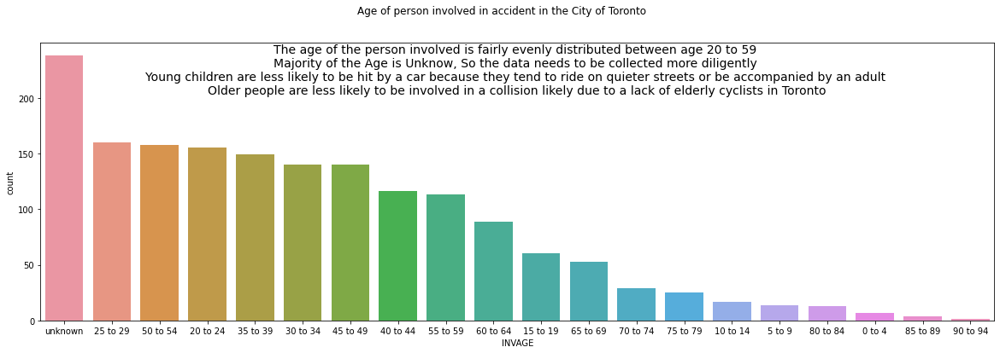

In [ ]:
f, ax = plt.subplots(nrows = 1, figsize = (20, 6))
f.subplots_adjust(hspace = 0.5)
f.suptitle("Age of person involved in accident in the City of Toronto")
sns.countplot(x="INVAGE", data=cycle, order = cycle.INVAGE.value_counts().index)
plt.annotate('The age of the person involved is fairly evenly distributed between age 20 to 59 \n'
             'Majority of the Age is Unknow, So the data needs to be collected more diligently \n'
             'Young children are less likely to be hit by a car because they tend to ride on quieter streets or be accompanied by an adult \n' 
             'Older people are less likely to be involved in a collision likely due to a lack of elderly cyclists in Toronto',
             xy=(0.5, 0.7), xytext=(0, 10),
             xycoords=('axes fraction', 'figure fraction'),
             textcoords='offset points',
             size=14, ha='center', va='bottom')

Text(0, 10, 'The vast majority of collisions occur with vehicles "going ahead" which is unsurprising because the \ndriving is mainly done going in this direction. The next highest is turning left which may be due to the blindspots \nfrom a driver\'s perspective as well as preoccupation with oncoming vehicles')

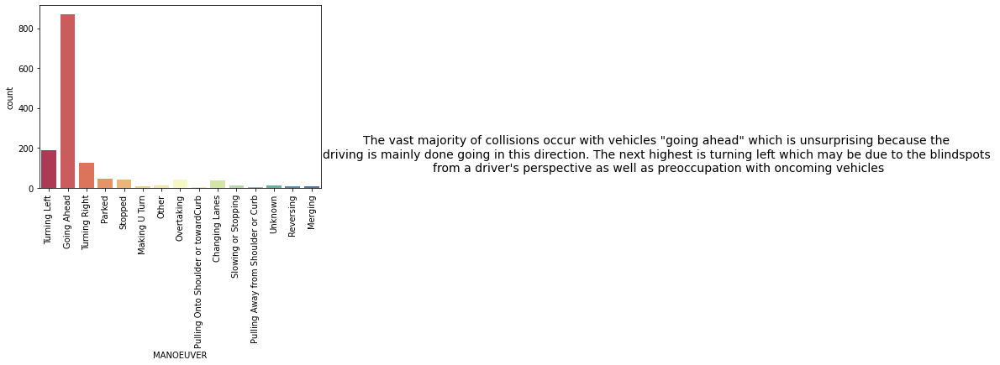

In [ ]:
# Plot most frequent actions drivers execute when hitting cyclists
sns.countplot(x='MANOEUVER', data=cycle, palette='Spectral')
plt.xticks(rotation=90)
plt.annotate('The vast majority of collisions occur with vehicles "going ahead" which is unsurprising because the \n' 
             'driving is mainly done going in this direction. The next highest is turning left which may be due to the blindspots \n'
             "from a driver's perspective as well as preoccupation with oncoming vehicles",
             xy=(2.2, 0.5), xytext=(0, 10),
             xycoords=('axes fraction', 'figure fraction'),
             textcoords='offset points',
             size=14, ha='center', va='bottom')

Text(0, 10, 'Toronto and East York make up 64% of the collisions, perhaps due to increased traffic in this district.')

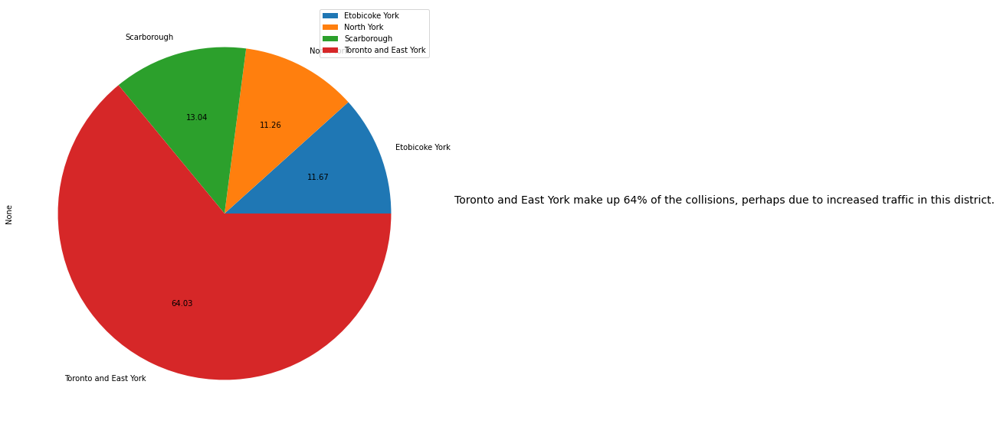

In [ ]:
# Plot the distribuition of districts where cyclist collisions occurred
cycle.groupby('District').size().plot(kind='pie', autopct='%.2f', figsize=(10,10), legend=True)
plt.annotate('Toronto and East York make up 64% of the collisions, perhaps due to increased traffic in this district.',
             xy=(1.7, 0.5), xytext=(0, 10),
             xycoords=('axes fraction', 'figure fraction'),
             textcoords='offset points',
             size=14, ha='center', va='bottom')

In [ ]:
#Showing the incidents on the map using the Geographic columns ( LATITUDE and LONGITUDE)
#With this map you can zoom in and Out of specific neighbourhoods and Streets where the incidents occured. 

import plotly.express as px 
fig = px.scatter_mapbox(cycle, lat="LATITUDE", lon="LONGITUDE")
fig.update_layout(mapbox_style="open-street-map") 
fig.show()

Text(0, 10, 'The vast majority of accidents are non-fatal. \nThe scatter plot confirms this and the location distribution and hot spots of the incidents.\nIt helps visualize the distribution of where the fatal and non fatal accidents happened in Toronto')

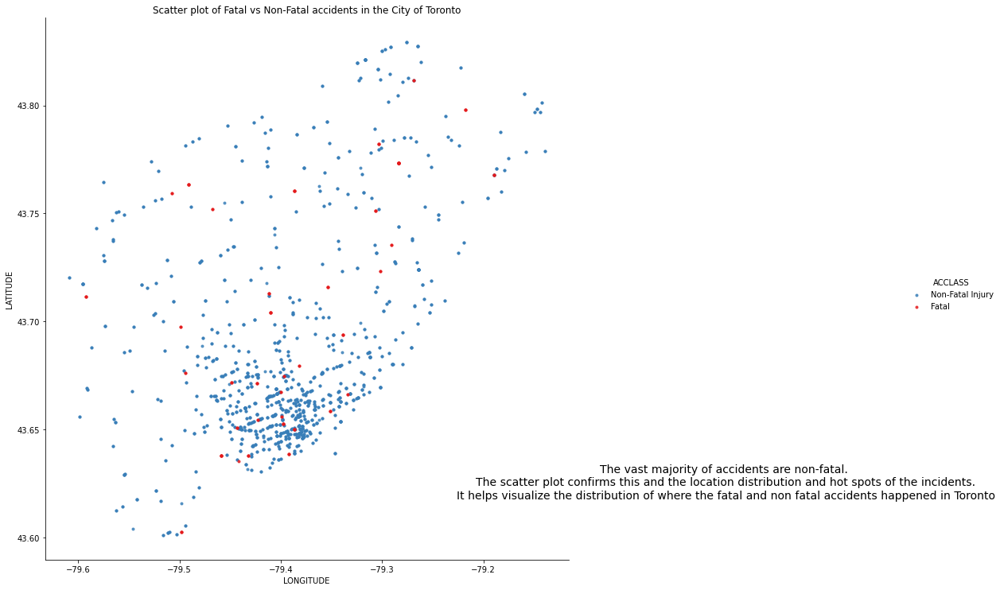

In [ ]:
# Scatter plot for fatal vs non-fatal accidents
color = ['#387eb8', '#e41a1c', '#4daf5a']
fig1 = sns.lmplot(y ='LATITUDE', x ='LONGITUDE', hue='ACCLASS',
           data = cycle, height = 10, markers = '.', fit_reg = False, palette = color) 
plt.title("Scatter plot of Fatal vs Non-Fatal accidents in the City of Toronto")
plt.annotate('The vast majority of accidents are non-fatal. \n' 
             'The scatter plot confirms this and the location distribution and hot spots of the incidents.\n' 
             'It helps visualize the distribution of where the fatal and non fatal accidents happened in Toronto',
             xy=(1.3, 0.2), xytext=(0, 10),
             xycoords=('axes fraction', 'figure fraction'),
             textcoords='offset points',
             size=14, ha='center', va='top')

Text(0, 10, 'Major arterial roads are where most collisions occur, \n This is likely due to the highest traffic volume being on these roads')

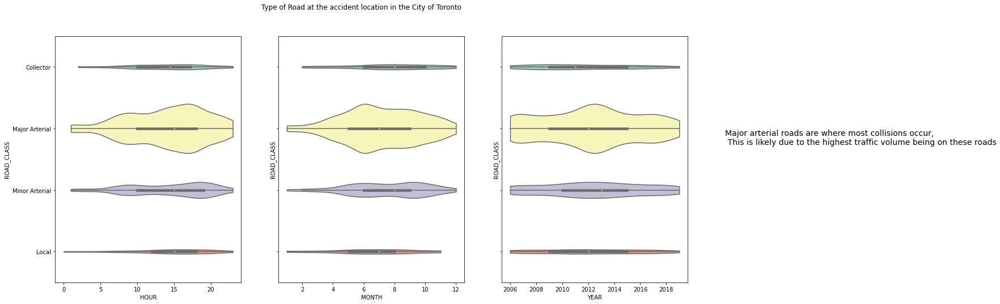

In [ ]:
# Plot type of road where collisions occurred
f, ax = plt.subplots(nrows = 1, ncols = 3, figsize = (20, 8), sharey = True)
f.suptitle("Type of Road at the accident location in the City of Toronto")
sns.violinplot(x = "HOUR", y = "ROAD_CLASS" , scale='count', data = cycle, cut=0, ax = ax[0], palette='Set3')
sns.violinplot(x = "MONTH", y = "ROAD_CLASS" , scale='count', data = cycle, cut=0, ax = ax[1],palette='Set3')
sns.violinplot(x = "YEAR", y = "ROAD_CLASS" , scale='count', data = cycle, cut=0, ax = ax[2], palette='Set3')
f.subplots_adjust(hspace = 0.5)
plt.annotate('Major arterial roads are where most collisions occur, \n ' 
             'This is likely due to the highest traffic volume being on these roads',
             xy=(1.2, 0.5), xytext=(0, 10),
             xycoords=('axes fraction', 'figure fraction'),
             textcoords='offset points',
             size=14, ha='left', va='bottom')

Text(0, 10, 'Almost all collisions occur during dry conditions \nWhen the weather is good, This is when the majority of cyclists are on the road')

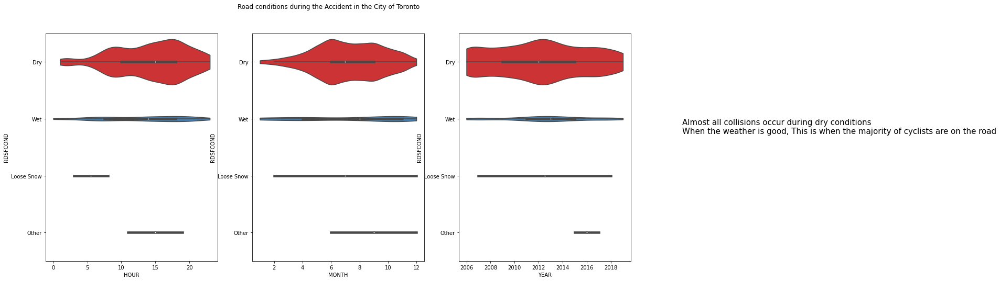

In [ ]:
# Plot distribution of road conditions for accidents
f, ax = plt.subplots(nrows = 1, ncols = 3, figsize = (20, 8))
f.subplots_adjust(hspace = 0.5)
f.suptitle("Road conditions during the Accident in the City of Toronto")
sns.violinplot(x = "YEAR", y = "RDSFCOND" , scale='count', data = cycle, cut=0, ax = ax[2], palette='Set1')
sns.violinplot(x = "MONTH", y = "RDSFCOND" , scale='count', data = cycle, cut=0, ax = ax[1],palette='Set1')
sns.violinplot(x = "HOUR", y = "RDSFCOND" , scale='count', data = cycle, cut=0, ax = ax[0], palette='Set1')
plt.annotate('Almost all collisions occur during dry conditions \n' 
             'When the weather is good, This is when the majority of cyclists are on the road',
             xy=(1.3, 0.5), xytext=(0, 10),
             xycoords=('axes fraction', 'figure fraction'),
             textcoords='offset points',
             size=15, ha='left', va='bottom')

Text(0, 10, 'Most collisions occur with clear weather conditions \nThis is when most cyclists are on the road')

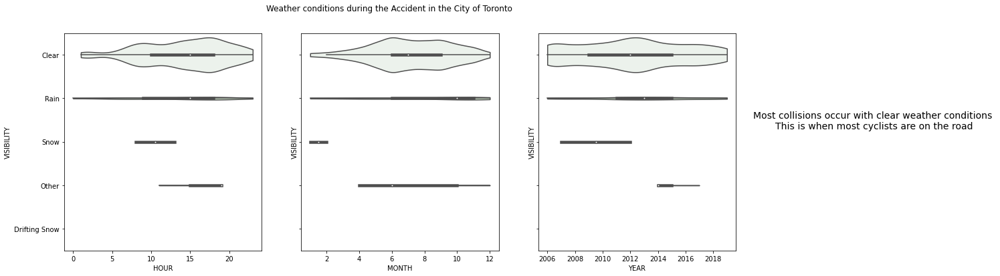

In [ ]:
f, ax = plt.subplots(nrows = 1, ncols = 3, figsize = (18, 6), sharey = True)
f.subplots_adjust(hspace = 0.5)
f.suptitle("Weather conditions during the Accident in the City of Toronto")
sns.violinplot(x = "YEAR", y = "VISIBILITY" , scale='count', data = cycle, cut=0, ax = ax[2], 
               palette=sns.light_palette((125, 90, 60), input="husl"))
sns.violinplot(x = "MONTH", y = "VISIBILITY" , scale='count', data = cycle, cut=0, ax = ax[1],
               palette=sns.light_palette((125, 90, 60), input="husl"))
sns.violinplot(x = "HOUR", y = "VISIBILITY" , scale='count', data = cycle, cut=0, ax = ax[0], 
               palette=sns.light_palette((125, 90, 60), input="husl"))
plt.annotate('Most collisions occur with clear weather conditions \n' 
             'This is when most cyclists are on the road',
             xy=(1.7, 0.5), xytext=(0, 10),
             xycoords=('axes fraction', 'figure fraction'),
             textcoords='offset points',
             size=14, ha='center', va='bottom')

Text(0, 10, '"Daylight" accounts for the majority of collisions, followed by "Dark" and "Dark, artificial" \nThere are very few collisions at dusk and dawn likely due to the lack of cyclists on the road at these times/light conditions')

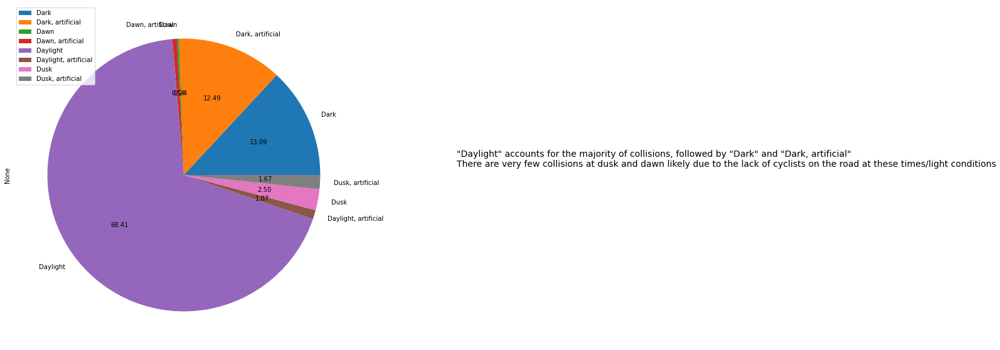

In [ ]:
# Visualize collision instances grouped by lighting 
cycle.groupby('LIGHT').size().plot(kind='pie', autopct='%.2f', figsize=(10,10), legend=True)
plt.annotate('"Daylight" accounts for the majority of collisions, followed by "Dark" and "Dark, artificial" \n' 
             'There are very few collisions at dusk and dawn likely due to the lack of cyclists on the road at these times/light conditions',
             xy=(1.3, 0.5), xytext=(0, 10),
             xycoords=('axes fraction', 'figure fraction'),
             textcoords='offset points',
             size=14, ha='left', va='bottom')

# **Other data sets**

In [ ]:
# Import the Bicycle_thefts.csv file

from google.colab import files
files.upload()

Saving Bicycle_Thefts.csv to Bicycle_Thefts.csv


{'Bicycle_Thefts.csv': b'X,Y,OBJECTID,event_unique_id,Primary_Offence,Occurrence_Date,Occurrence_Year,Occurrence_Month,Occurrence_DayOfWeek,Occurrence_DayOfMonth,Occurrence_DayOfYear,Occurrence_Hour,Report_Date,Report_Year,Report_Month,Report_DayOfWeek,Report_DayOfMonth,Report_DayOfYear,Report_Hour,Division,City,Hood_ID,NeighbourhoodName,Location_Type,Premises_Type,Bike_Make,Bike_Model,Bike_Type,Bike_Speed,Bike_Colour,Cost_of_Bike,Status,Longitude,Latitude,ObjectId2\r\n-8850629.735,5411195.656,17744,GO-20179016397,THEFT UNDER,2017/10/03 04:00:00+00,2017,October,Tuesday,3,276,14,2017/10/03 04:00:00+00,2017,October,Tuesday,3,276,18,D22,Toronto,15,Kingsway South (15),"Streets, Roads, Highways (Bicycle Path, Private Road)",Outside,GI,ESCAPE 2,OT,7,BLK,700,STOLEN,-79.50655965,43.64842688,1\r\n-8850439.277,5412148.946,17759,GO-20172033056,THEFT UNDER - BICYCLE,2017/11/08 05:00:00+00,2017,November,Wednesday,8,312,3,2017/11/08 05:00:00+00,2017,November,Wednesday,8,312,22,D22,Toronto,15,Kingswa

In [ ]:
# Import bicycle theft data (2009-2019)
import pandas as pd


theft = pd.read_csv('Bicycle_Thefts.csv', sep=',', error_bad_lines=False, encoding="latin-1")

**Data exploration**

In [ ]:
theft.head()

,X,Y,OBJECTID,event_unique_id,Primary_Offence,Occurrence_Date,Occurrence_Year,Occurrence_Month,Occurrence_DayOfWeek,Occurrence_DayOfMonth,Occurrence_DayOfYear,Occurrence_Hour,Report_Date,Report_Year,Report_Month,Report_DayOfWeek,Report_DayOfMonth,Report_DayOfYear,Report_Hour,Division,City,Hood_ID,NeighbourhoodName,Location_Type,Premises_Type,Bike_Make,Bike_Model,Bike_Type,Bike_Speed,Bike_Colour,Cost_of_Bike,Status,Longitude,Latitude,ObjectId2
0,-8850629.735,5411195.656,17744,GO-20179016397,THEFT UNDER,2017/10/03 04:00:00+00,2017,October,Tuesday,3,276,14,2017/10/03 04:00:00+00,2017,October,Tuesday,3,276,18,D22,Toronto,15,Kingsway South (15),"Streets, Roads, Highways (Bicycle Path, Privat...",Outside,GI,ESCAPE 2,OT,7,BLK,700.0,STOLEN,-79.506560,43.648427,1
1,-8850439.277,5412148.946,17759,GO-20172033056,THEFT UNDER - BICYCLE,2017/11/08 05:00:00+00,2017,November,Wednesday,8,312,3,2017/11/08 05:00:00+00,2017,November,Wednesday,8,312,22,D22,Toronto,15,Kingsway South (15),"Single Home, House (Attach Garage, Cottage, Mo...",House,UNKNOWN MAKE,NaN,TO,1,BLK,1100.0,RECOVERED,-79.504849,43.654623,2
2,-8851202.975,5411168.906,17906,GO-20189030822,THEFT UNDER - BICYCLE,2018/09/14 04:00:00+00,2018,September,Friday,14,257,9,2018/09/17 04:00:00+00,2018,September,Monday,17,260,16,D22,Toronto,15,Kingsway South (15),Ttc Subway Station,Transit,OT,CROSSTRAIL,MT,24,BLK,904.0,STOLEN,-79.511709,43.648253,3
3,-8851202.975,5411168.906,17962,GO-2015804467,THEFT UNDER,2015/05/07 04:00:00+00,2015,May,Thursday,7,127,18,2015/05/14 04:00:00+00,2015,May,Thursday,14,134,14,D22,Toronto,15,Kingsway South (15),Ttc Subway Station,Transit,GT,NaN,TO,10,BLKDGR,400.0,STOLEN,-79.511709,43.648253,4
4,-8851160.386,5411032.192,17963,GO-20159002781,THEFT UNDER,2015/05/16 04:00:00+00,2015,May,Saturday,16,136,12,2015/05/16 04:00:00+00,2015,May,Saturday,16,136,15,D22,Toronto,15,Kingsway South (15),Ttc Subway Station,Transit,GI,NaN,MT,6,RED,600.0,STOLEN,-79.511327,43.647364,5


In [ ]:
# View shape of the dataset
theft.shape

(25569, 35)

In [ ]:
theft.describe

<bound method NDFrame.describe of                  X            Y  OBJECTID  ...  Longitude   Latitude ObjectId2
0     -8850629.735  5411195.656     17744  ... -79.506560  43.648427         1
1     -8850439.277  5412148.946     17759  ... -79.504849  43.654623         2
2     -8851202.975  5411168.906     17906  ... -79.511709  43.648253         3
3     -8851202.975  5411168.906     17962  ... -79.511709  43.648253         4
4     -8851160.386  5411032.192     17963  ... -79.511327  43.647364         5
...            ...          ...       ...  ...        ...        ...       ...
25564 -8818235.077  5435746.497      9361  ... -79.215553  43.807798     25565
25565 -8818470.737  5436317.146     11318  ... -79.217670  43.811497     25566
25566 -8820513.121  5433290.808     11462  ... -79.236018  43.791876     25567
25567 -8816571.263  5433956.788     11695  ... -79.200607  43.796194     25568
25568 -8820661.167  5433802.263     11883  ... -79.237347  43.795193     25569

[25569 rows x 35 

In [ ]:
# Identify columns with null values
theft.isna().sum()

X                           0
Y                           0
OBJECTID                    0
event_unique_id             0
Primary_Offence             0
Occurrence_Date             0
Occurrence_Year             0
Occurrence_Month            0
Occurrence_DayOfWeek        0
Occurrence_DayOfMonth       0
Occurrence_DayOfYear        0
Occurrence_Hour             0
Report_Date                 0
Report_Year                 0
Report_Month                0
Report_DayOfWeek            0
Report_DayOfMonth           0
Report_DayOfYear            0
Report_Hour                 0
Division                    0
City                        0
Hood_ID                     0
NeighbourhoodName           0
Location_Type               0
Premises_Type               0
Bike_Make                 121
Bike_Model               9646
Bike_Type                   0
Bike_Speed                  0
Bike_Colour              2061
Cost_of_Bike             1744
Status                      0
Longitude                   0
Latitude  

**Data cleaning**

In [ ]:
# Drop unwanted columns
theft = theft.drop(["Report_Date", "Report_Year", "Report_Month", "Report_DayOfWeek", "Hood_ID", 
                    "Report_DayOfMonth","Report_DayOfYear", "Report_Hour", "X", "Y", "OBJECTID", 
                    "event_unique_id", "ObjectId2", "Occurrence_DayOfMonth", 'Occurrence_DayOfYear', 
                    'City', 'Bike_Make', 'Bike_Model', 'Bike_Speed'], axis=1)

In [ ]:
# Add new column to identify Theft occurrences for when the tables are merged
theft['Incident Type'] = pd.Series(['THEFT' for x in range(len(theft.index))], index=theft.index)

In [ ]:
theft.head()

,Primary_Offence,Occurrence_Date,Occurrence_Year,Occurrence_Month,Occurrence_DayOfWeek,Occurrence_Hour,Division,NeighbourhoodName,Location_Type,Premises_Type,Bike_Type,Bike_Colour,Cost_of_Bike,Status,Longitude,Latitude,Incident Type
0,THEFT UNDER,2017/10/03 04:00:00+00,2017,October,Tuesday,14,D22,Kingsway South (15),"Streets, Roads, Highways (Bicycle Path, Privat...",Outside,OT,BLK,700.0,STOLEN,-79.506560,43.648427,THEFT
1,THEFT UNDER - BICYCLE,2017/11/08 05:00:00+00,2017,November,Wednesday,3,D22,Kingsway South (15),"Single Home, House (Attach Garage, Cottage, Mo...",House,TO,BLK,1100.0,RECOVERED,-79.504849,43.654623,THEFT
2,THEFT UNDER - BICYCLE,2018/09/14 04:00:00+00,2018,September,Friday,9,D22,Kingsway South (15),Ttc Subway Station,Transit,MT,BLK,904.0,STOLEN,-79.511709,43.648253,THEFT
3,THEFT UNDER,2015/05/07 04:00:00+00,2015,May,Thursday,18,D22,Kingsway South (15),Ttc Subway Station,Transit,TO,BLKDGR,400.0,STOLEN,-79.511709,43.648253,THEFT
4,THEFT UNDER,2015/05/16 04:00:00+00,2015,May,Saturday,12,D22,Kingsway South (15),Ttc Subway Station,Transit,MT,RED,600.0,STOLEN,-79.511327,43.647364,THEFT


In [ ]:
# Rename columns to limit duplicates
theft = theft.rename(columns={"Occurrence_Date" : "DATE",'Occurrence_Year' : 'YEAR', 'Occurrence_Month' : 'MONTH','Occurrence_DayOfWeek' : 'DAY',
                              "NeighbourhoodName" : "Neighbourhood", "Occurrence_Hour":"HOUR", "Latitude":"LATITUDE", 'Longitude':'LONGITUDE'})

In [ ]:
theft.head()

,Primary_Offence,DATE,YEAR,MONTH,DAY,HOUR,Division,Neighbourhood,Location_Type,Premises_Type,Bike_Type,Bike_Colour,Cost_of_Bike,Status,LONGITUDE,LATITUDE,Incident Type
0,THEFT UNDER,2017/10/03 04:00:00+00,2017,October,Tuesday,14,D22,Kingsway South (15),"Streets, Roads, Highways (Bicycle Path, Privat...",Outside,OT,BLK,700.0,STOLEN,-79.506560,43.648427,THEFT
1,THEFT UNDER - BICYCLE,2017/11/08 05:00:00+00,2017,November,Wednesday,3,D22,Kingsway South (15),"Single Home, House (Attach Garage, Cottage, Mo...",House,TO,BLK,1100.0,RECOVERED,-79.504849,43.654623,THEFT
2,THEFT UNDER - BICYCLE,2018/09/14 04:00:00+00,2018,September,Friday,9,D22,Kingsway South (15),Ttc Subway Station,Transit,MT,BLK,904.0,STOLEN,-79.511709,43.648253,THEFT
3,THEFT UNDER,2015/05/07 04:00:00+00,2015,May,Thursday,18,D22,Kingsway South (15),Ttc Subway Station,Transit,TO,BLKDGR,400.0,STOLEN,-79.511709,43.648253,THEFT
4,THEFT UNDER,2015/05/16 04:00:00+00,2015,May,Saturday,12,D22,Kingsway South (15),Ttc Subway Station,Transit,MT,RED,600.0,STOLEN,-79.511327,43.647364,THEFT


In [ ]:
# Value counts for columns of interest
theft['Primary_Offence'].value_counts()

THEFT UNDER                   11904
THEFT UNDER - BICYCLE          9891
B&E                            1738
THEFT OF EBIKE UNDER $5000      462
PROPERTY - FOUND                320
                              ...  
MHA SEC 16 (FORM 2)               1
FIRE - DETERMINED                 1
MISCHIEF - ENDANGER LIFE          1
ASSAULT BODILY HARM               1
INFORMATION ONLY                  1
Name: Primary_Offence, Length: 66, dtype: int64

In [ ]:
theft['HOUR'].value_counts()

18    1724
17    1618
12    1561
19    1435
9     1434
0     1430
16    1363
20    1354
15    1268
21    1250
8     1201
23    1190
14    1184
22    1167
13    1129
10    1069
11     971
1      702
7      644
2      465
6      421
3      388
5      304
4      297
Name: HOUR, dtype: int64

In [ ]:
theft['YEAR'].value_counts()

2018    3960
2017    3872
2020    3833
2016    3813
2019    3717
2015    3289
2014    3031
2013      46
2011       3
2012       2
2010       2
2009       1
Name: YEAR, dtype: int64

In [ ]:
theft['Neighbourhood'].value_counts()

Waterfront Communities-The Island (77)    2576
Bay Street Corridor (76)                  2112
Church-Yonge Corridor (75)                1676
Niagara (82)                               992
Annex (95)                                 947
                                          ... 
Rustic (28)                                 12
Thistletown-Beaumond Heights (3)            10
Beechborough-Greenbrook (112)                9
Rexdale-Kipling (4)                          7
Maple Leaf (29)                              6
Name: Neighbourhood, Length: 141, dtype: int64

In [ ]:
theft['Bike_Colour'].value_counts()

BLK       7422
BLU       2331
GRY       2197
WHI       1982
RED       1755
          ... 
SILLGR       1
GLDOTH       1
SILPNK       1
PLEMRN       1
MRNSIL       1
Name: Bike_Colour, Length: 252, dtype: int64

Text(0, 10, 'It appears that the cost of bikes stolen decreases greatly when they are stolen outside of transit hubs and schools \nThis is could be due to people not wanting to bring and leave valuable bikes in these areas \nAlso could be the demographics in schools being young, mostly student, so they do not buy expensive bikes')

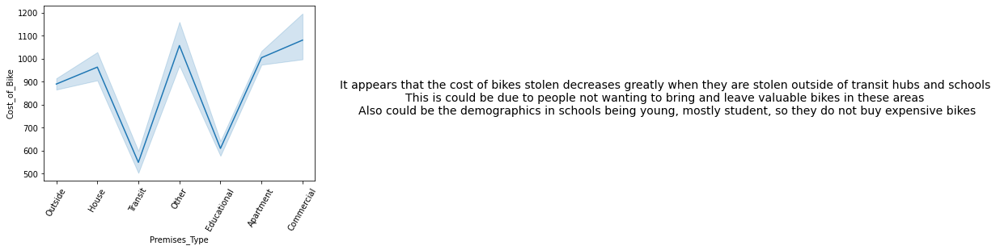

In [ ]:
# Plot cost of bikes stolen by premise type
import seaborn as sns
import matplotlib.pyplot as plt

sns.lineplot(x='Premises_Type', y='Cost_of_Bike', data=theft)
plt.xticks(rotation=60)
plt.annotate('It appears that the cost of bikes stolen decreases greatly when they are stolen outside of transit hubs and schools \n' 
             'This is could be due to people not wanting to bring and leave valuable bikes in these areas \n'
             'Also could be the demographics in schools being young, mostly student, so they do not buy expensive bikes',
             xy=(2.3, 0.5), xytext=(0, 10),
             xycoords=('axes fraction', 'figure fraction'),
             textcoords='offset points',
             size=14, ha='center', va='bottom')

Text(0, 10, 'The number of bikes stolen between 2009-2013 is extremely low, possibly due to lack of data collection or storage by Toronto Police \nThefts have remained consistently high from 2014-2020, especially from 2016 onward')

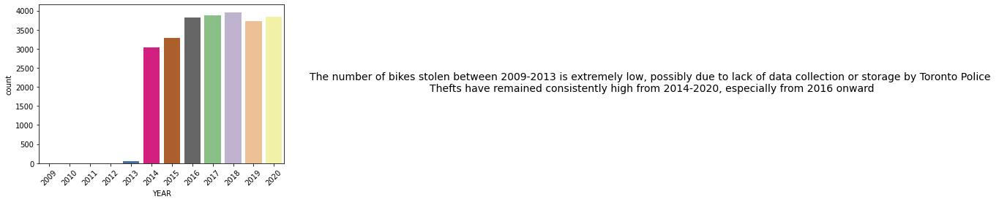

In [ ]:
# Plot number of theft reported each year
sns.countplot(x='YEAR', data=theft, palette='Accent')
plt.xticks(rotation=45)
plt.annotate('The number of bikes stolen between 2009-2013 is extremely low, possibly due to lack of data collection or storage by Toronto Police \n' 
             'Thefts have remained consistently high from 2014-2020, especially from 2016 onward',
             xy=(2.5, 0.5), xytext=(0, 10),
             xycoords=('axes fraction', 'figure fraction'),
             textcoords='offset points',
             size=14, ha='center', va='bottom')

Text(0, 10, 'The summer is when most bikes are stolen \nPeople tend to remove their bicycles from storage during this time \nCycling increases in the warmer months, hence more possiblity of thefts \nMore demand and more supply')

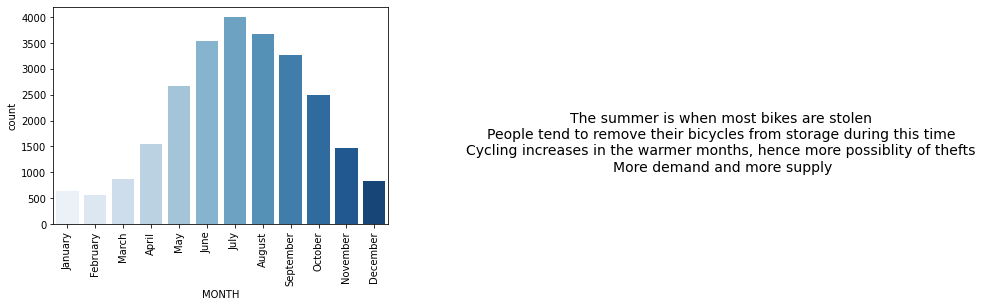

In [ ]:
# Plot number of theft reported by month
sns.countplot(x='MONTH', data=theft, order=['January','February','March', 'April','May','June',
'July','August','September','October','November','December'], palette='Blues')
plt.xticks(rotation=90)
plt.annotate('The summer is when most bikes are stolen \n' 
             'People tend to remove their bicycles from storage during this time \n' 
             'Cycling increases in the warmer months, hence more possiblity of thefts \n'
             'More demand and more supply',
             xy=(2, 0.4), xytext=(0, 10),
             xycoords=('axes fraction', 'figure fraction'),
             textcoords='offset points',
             size=14, ha='center', va='bottom')

Text(0, 10, 'Bicycle thefts remain consistently high throughout the week but there is a small drop-off on Sundays \nSunday thefts still remain high so this drop-off is likely insignificant')

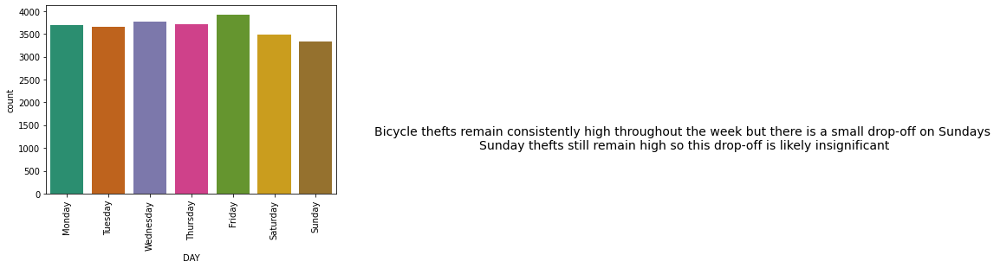

In [ ]:
# Plot number of theft reported by day 
sns.countplot(x='DAY', data=theft, order=['Monday','Tuesday','Wednesday', 'Thursday','Friday','Saturday',
'Sunday'], palette='Dark2')
plt.xticks(rotation=90)
plt.annotate('Bicycle thefts remain consistently high throughout the week but there is a small drop-off on Sundays \n' 
             'Sunday thefts still remain high so this drop-off is likely insignificant',
             xy=(2.2, 0.4), xytext=(0, 10),
             xycoords=('axes fraction', 'figure fraction'),
             textcoords='offset points',
             size=14, ha='center', va='bottom')

Text(0, 10, 'Only 1.2% of bicycles stolen are recovered \nBicycles are easier to hide and harder to identify as the stolen bike because not all of them have easily visible serial numbers \nEven for bicycles with visible serial numbers, very few people take note of it when they purchase the bike \nAlso the high volume of bikes sold makes stolen bikes difficult to identify as there are so many on the street \nStolen bikes can also be easily modified by thief to make it harder to trace \nToronto is also quite a big city, so bikes can be moved across the city, making them harder to recover \nOfficers would need to stop many innocent civilians to check their bicycles in the search for the stolen bike \n')

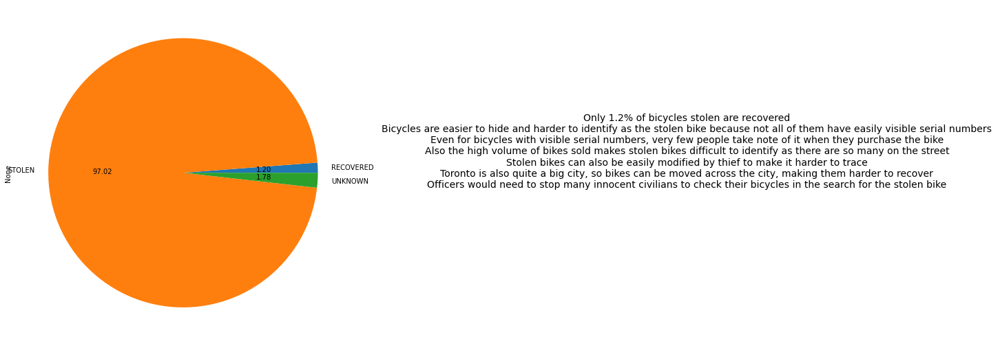

In [ ]:
# Plot the status of the stolen bikes to determine how many were recovered
theft.groupby('Status').size().plot(kind='pie', autopct='%.2f', figsize=(9,9))
plt.annotate('Only 1.2% of bicycles stolen are recovered \n' 
             'Bicycles are easier to hide and harder to identify as the stolen bike because not all of them have easily visible serial numbers \n' 
             'Even for bicycles with visible serial numbers, very few people take note of it when they purchase the bike \n'
             'Also the high volume of bikes sold makes stolen bikes difficult to identify as there are so many on the street \n'
             'Stolen bikes can also be easily modified by thief to make it harder to trace \n'
             'Toronto is also quite a big city, so bikes can be moved across the city, making them harder to recover \n'
             'Officers would need to stop many innocent civilians to check their bicycles in the search for the stolen bike \n',
             xy=(2, 0.4), xytext=(0, 10),
             xycoords=('axes fraction', 'figure fraction'),
             textcoords='offset points',
             size=14, ha='center', va='bottom')

Text(0, 10, 'Much like with collisions, bicycle thefts are usually reported stolen between 5PM-7PM \nWith more cyclists on the road it is more likely that criminals will be able to identify which bikes they want to steal at this time \nIt may also be that some of the thefts are reported at this time because the cyclist did not notice it had been stolen until they left work')

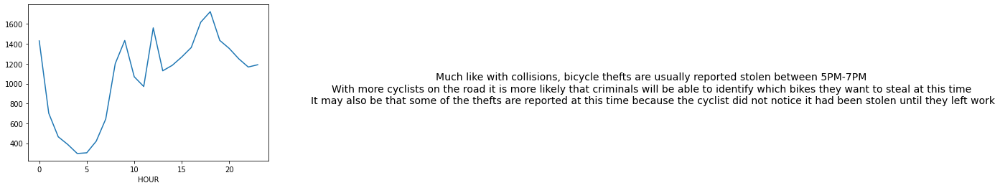

In [ ]:
# Visualize thefts by hour in the day
theft.groupby('HOUR').size().plot(kind='line')
plt.annotate('Much like with collisions, bicycle thefts are usually reported stolen between 5PM-7PM \n' 
             'With more cyclists on the road it is more likely that criminals will be able to identify which bikes they want to steal at this time \n'
             'It may also be that some of the thefts are reported at this time because the cyclist did not notice it had been stolen until they left work',
             xy=(2.6, 0.4), xytext=(0, 10),
             xycoords=('axes fraction', 'figure fraction'),
             textcoords='offset points',
             size=14, ha='center', va='bottom')

Text(0, 10, 'Most bikes get stolen when left outside, this is where criminals can spot the bikes and have the easiest access \nBeing able to ride away faster than someone can follow on foot may also be a factor in why so many bikes get stolen outside \nApartment complexes also have a high number of thefts \nThe high number of people living in an apartment makes it more likely there will be a witness but less likely for the witness to understand that a crime is occurring')

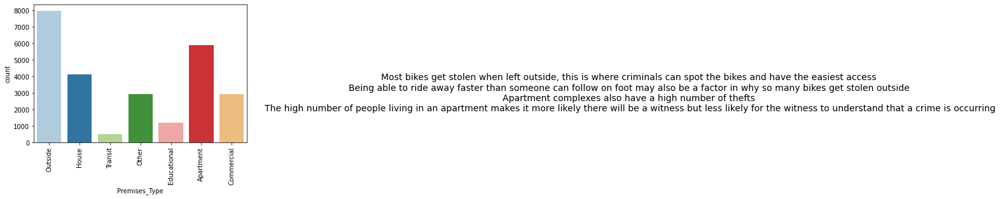

In [ ]:
# Plot number of theft reported each year by premises type
sns.countplot(x='Premises_Type', data=theft, palette='Paired')
plt.xticks(rotation=90)
plt.annotate('Most bikes get stolen when left outside, this is where criminals can spot the bikes and have the easiest access \n' 
             'Being able to ride away faster than someone can follow on foot may also be a factor in why so many bikes get stolen outside \n' 
             'Apartment complexes also have a high number of thefts \n' 
             'The high number of people living in an apartment makes it more likely there will be a witness but less likely for the witness to understand that a crime is occurring',
             xy=(2.8, 0.4), xytext=(0, 10),
             xycoords=('axes fraction', 'figure fraction'),
             textcoords='offset points',
             size=14, ha='center', va='bottom')

In [ ]:
# View column data types
cycle.dtypes

YEAR                      int64
DATE             datetime64[ns]
TIME                      int64
HOUR                      int64
ROAD_CLASS               object
District                 object
Division                  int64
LATITUDE                float64
LONGITUDE               float64
LOCCOORD                 object
ACCLOC                   object
TRAFFCTL                 object
VISIBILITY               object
LIGHT                    object
RDSFCOND                 object
ACCLASS                  object
IMPACTYPE                object
INVTYPE                  object
INVAGE                   object
INJURY                   object
VEHTYPE                  object
MANOEUVER                object
DRIVACT                  object
PEDESTRIAN               object
SPEEDING                 object
AG_DRIV                  object
REDLIGHT                 object
ALCOHOL                  object
Neighbourhood            object
Incident Type            object
Vehicle Type             object
MONTH   

In [ ]:
theft.dtypes

Primary_Offence     object
DATE                object
YEAR                 int64
MONTH               object
DAY                 object
HOUR                 int64
Division            object
Neighbourhood       object
Location_Type       object
Premises_Type       object
Bike_Type           object
Bike_Colour         object
Cost_of_Bike       float64
Status              object
LONGITUDE          float64
LATITUDE           float64
Incident Type       object
dtype: object

In [ ]:
# Remove letters from Division column in theft dataframe to convert it to integer
# This will make it easier to work with the data as it will be the same type as in the 'cycle' dataframe
theft['Division'] = theft['Division'].map(lambda x: x.lstrip('D'))

In [ ]:
theft.Division.unique()

array(['22', '31', '23', '52', '32', '13', '12', '33', '53', '54', '42',
       '55', '51', '14', '11', '41', '43', 'NSA'], dtype=object)

In [ ]:
# Count unique values in the Division column
theft['Division'].value_counts()

14     4580
52     4389
51     4100
53     2287
55     1959
11     1808
32     1235
22     1116
13      966
54      734
41      465
31      421
43      417
33      392
12      250
23      223
42      218
NSA       9
Name: Division, dtype: int64

In [ ]:
# Replace NSA with no value to convert to integer, NSA is not a police division in Toronto and only appears 9 times
theft= theft.replace('NSA', None)

In [ ]:
# Convert the Division column from 'theft' dataframe to integer data type
theft['Division'] = pd.to_numeric(theft['Division'])

In [ ]:
# Confirm Division has been changed into integer
theft.dtypes

Primary_Offence     object
DATE                object
YEAR                 int64
MONTH               object
DAY                 object
HOUR                 int64
Division             int64
Neighbourhood       object
Location_Type       object
Premises_Type       object
Bike_Type           object
Bike_Colour         object
Cost_of_Bike       float64
Status              object
LONGITUDE          float64
LATITUDE           float64
Incident Type       object
dtype: object

In [ ]:
# Change Month column in cycle dataset from numeric to month names to match theft data
cycle['MONTH'] = cycle['MONTH'].apply(lambda x: calendar.month_name[x])

In [ ]:
# Combine Tables using append function
full = cycle.append(theft)

In [ ]:
full.shape

(27250, 40)

In [ ]:
full.head()

,YEAR,DATE,TIME,HOUR,ROAD_CLASS,District,Division,LATITUDE,LONGITUDE,LOCCOORD,ACCLOC,TRAFFCTL,VISIBILITY,LIGHT,RDSFCOND,ACCLASS,IMPACTYPE,INVTYPE,INVAGE,INJURY,VEHTYPE,MANOEUVER,DRIVACT,PEDESTRIAN,SPEEDING,AG_DRIV,REDLIGHT,ALCOHOL,Neighbourhood,Incident Type,Vehicle Type,MONTH,DAY,Primary_Offence,Location_Type,Premises_Type,Bike_Type,Bike_Colour,Cost_of_Bike,Status
0,2006,2006-02-11 00:00:00,1804.0,18,Collector,North York,33,43.752745,-79.32639,Intersection,At Intersection,No Control,Clear,Dark,Dry,Non-Fatal Injury,Cyclist Collisions,Driver,65 to 69,None,"Automobile, Station Wagon",Turning Left,Improper Turn,No,No,No,No,No,Parkwoods-Donalda (45),COLLISION,AUTOMOBILE,February,Saturday,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2006,2006-02-11 00:00:00,1804.0,18,Collector,North York,33,43.752745,-79.32639,Intersection,At Intersection,No Control,Clear,Dark,Dry,Non-Fatal Injury,Cyclist Collisions,Cyclist,20 to 24,Major,Bicycle,Going Ahead,NaN,No,No,No,No,No,Parkwoods-Donalda (45),COLLISION,AUTOMOBILE,February,Saturday,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2006,2006-02-27 00:00:00,1955.0,19,Major Arterial,Scarborough,43,43.770645,-79.18689,Intersection,NaN,Traffic Signal,Clear,Dark,Wet,Non-Fatal Injury,Cyclist Collisions,Vehicle Owner,unknown,NaN,Other,NaN,NaN,No,No,Yes,No,No,West Hill (136),COLLISION,TRANSIT OR CITY VEHICLE,February,Monday,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2006,2006-02-27 00:00:00,1955.0,19,Major Arterial,Scarborough,43,43.770645,-79.18689,Intersection,NaN,Traffic Signal,Clear,Dark,Wet,Non-Fatal Injury,Cyclist Collisions,Driver,35 to 39,None,Municipal Transit Bus (TTC),Turning Right,Failed to Yield Right of Way,No,No,Yes,No,No,West Hill (136),COLLISION,TRANSIT OR CITY VEHICLE,February,Monday,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2006,2006-02-27 00:00:00,1955.0,19,Major Arterial,Scarborough,43,43.770645,-79.18689,Intersection,NaN,Traffic Signal,Clear,Dark,Wet,Non-Fatal Injury,Cyclist Collisions,Cyclist,25 to 29,Major,Bicycle,Going Ahead,NaN,No,No,Yes,No,No,West Hill (136),COLLISION,TRANSIT OR CITY VEHICLE,February,Monday,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# Convert Date to datetime format
full['DATE']=pd.to_datetime(full['DATE'])

In [ ]:
full['DATE'].dtypes

datetime64[ns, UTC]

In [ ]:
# Format the Date column to display only the month, day and year
full['DATE'] = full["DATE"].dt.strftime("%m/%d/%y")

In [ ]:
full['DATE'].dtypes

dtype('O')

In [ ]:
# Convert Date back into datetime format for ease of use in analysis
full['DATE']=pd.to_datetime(full['DATE'])

In [ ]:
full.dtypes

YEAR                        int64
DATE               datetime64[ns]
TIME                      float64
HOUR                        int64
ROAD_CLASS                 object
District                   object
Division                    int64
LATITUDE                  float64
LONGITUDE                 float64
LOCCOORD                   object
ACCLOC                     object
TRAFFCTL                   object
VISIBILITY                 object
LIGHT                      object
RDSFCOND                   object
ACCLASS                    object
IMPACTYPE                  object
INVTYPE                    object
INVAGE                     object
INJURY                     object
VEHTYPE                    object
MANOEUVER                  object
DRIVACT                    object
PEDESTRIAN                 object
SPEEDING                   object
AG_DRIV                    object
REDLIGHT                   object
ALCOHOL                    object
Neighbourhood              object
Incident Type 

In [ ]:
# View new date format
full.head(3)

,YEAR,DATE,TIME,HOUR,ROAD_CLASS,District,Division,LATITUDE,LONGITUDE,LOCCOORD,ACCLOC,TRAFFCTL,VISIBILITY,LIGHT,RDSFCOND,ACCLASS,IMPACTYPE,INVTYPE,INVAGE,INJURY,VEHTYPE,MANOEUVER,DRIVACT,PEDESTRIAN,SPEEDING,AG_DRIV,REDLIGHT,ALCOHOL,Neighbourhood,Incident Type,Vehicle Type,MONTH,DAY,Primary_Offence,Location_Type,Premises_Type,Bike_Type,Bike_Colour,Cost_of_Bike,Status
0,2006,2006-02-11,1804.0,18,Collector,North York,33,43.752745,-79.32639,Intersection,At Intersection,No Control,Clear,Dark,Dry,Non-Fatal Injury,Cyclist Collisions,Driver,65 to 69,None,"Automobile, Station Wagon",Turning Left,Improper Turn,No,No,No,No,No,Parkwoods-Donalda (45),COLLISION,AUTOMOBILE,February,Saturday,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2006,2006-02-11,1804.0,18,Collector,North York,33,43.752745,-79.32639,Intersection,At Intersection,No Control,Clear,Dark,Dry,Non-Fatal Injury,Cyclist Collisions,Cyclist,20 to 24,Major,Bicycle,Going Ahead,NaN,No,No,No,No,No,Parkwoods-Donalda (45),COLLISION,AUTOMOBILE,February,Saturday,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2006,2006-02-27,1955.0,19,Major Arterial,Scarborough,43,43.770645,-79.18689,Intersection,NaN,Traffic Signal,Clear,Dark,Wet,Non-Fatal Injury,Cyclist Collisions,Vehicle Owner,unknown,NaN,Other,NaN,NaN,No,No,Yes,No,No,West Hill (136),COLLISION,TRANSIT OR CITY VEHICLE,February,Monday,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
full.tail(3)

,YEAR,DATE,TIME,HOUR,ROAD_CLASS,District,Division,LATITUDE,LONGITUDE,LOCCOORD,ACCLOC,TRAFFCTL,VISIBILITY,LIGHT,RDSFCOND,ACCLASS,IMPACTYPE,INVTYPE,INVAGE,INJURY,VEHTYPE,MANOEUVER,DRIVACT,PEDESTRIAN,SPEEDING,AG_DRIV,REDLIGHT,ALCOHOL,Neighbourhood,Incident Type,Vehicle Type,MONTH,DAY,Primary_Offence,Location_Type,Premises_Type,Bike_Type,Bike_Colour,Cost_of_Bike,Status
25566,2016,2016-06-04,NaN,22,NaN,NaN,42,43.791876,-79.236018,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Malvern (132),THEFT,NaN,June,Saturday,THEFT UNDER,"Apartment (Rooming House, Condo)",Apartment,MT,WHI,700.0,STOLEN
25567,2016,2016-07-04,NaN,20,NaN,NaN,42,43.796194,-79.200607,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Malvern (132),THEFT,NaN,July,Monday,THEFT UNDER,Other Commercial / Corporate Places (For Profi...,Commercial,SC,NaN,3000.0,STOLEN
25568,2016,2016-07-22,NaN,9,NaN,NaN,42,43.795193,-79.237347,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Malvern (132),THEFT,NaN,July,Friday,THEFT UNDER - BICYCLE,"Parking Lots (Apt., Commercial Or Non-Commercial)",Outside,MT,ONG,200.0,STOLEN


In [ ]:
#Showing the incidents on the map using the Geographic columns ( LATITUDE and LONGITUDE)
import plotly.express as px 

fig = px.scatter_mapbox(full, lat="LATITUDE", lon="LONGITUDE", color="Incident Type")
fig.update_layout(mapbox_style="open-street-map") 
fig.show()

Text(0, 10, 'The vast majority of incidents are thefts. \nThe scatter plot confirms this and the location distribution and hot spots of the incidents.\nIt helps visualize the location of where majority of the thefts and collision incidents happened in Toronto')

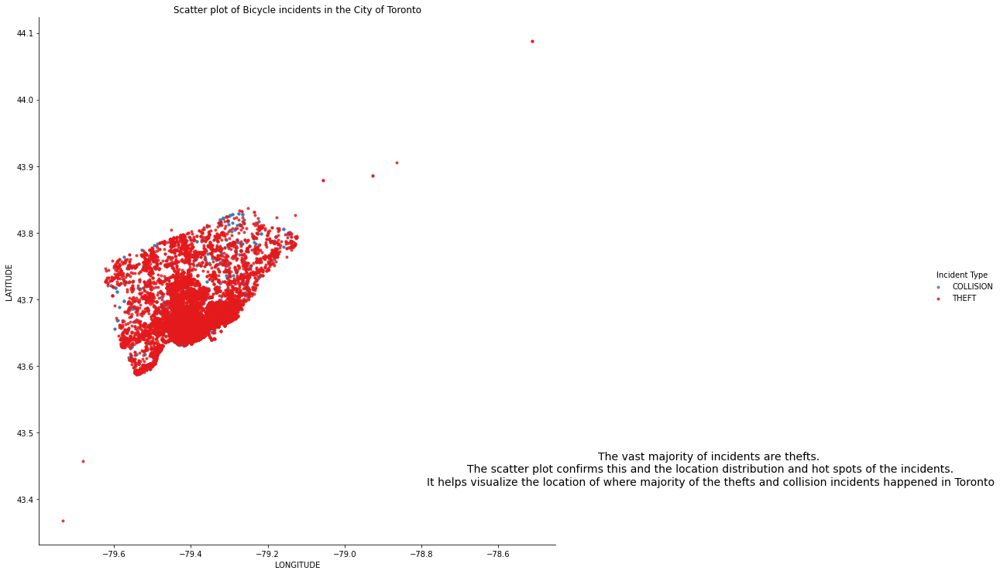

In [ ]:
# Scatter plot of Bicycle Incidents filtered by type
colors = ['#387eb8', '#e41a1c']
fig1 = sns.lmplot(y ='LATITUDE', x ='LONGITUDE', hue='Incident Type',
           data = full, height = 10, markers = '.', fit_reg = False, palette = colors) 
plt.title("Scatter plot of Bicycle incidents in the City of Toronto")

plt.annotate('The vast majority of incidents are thefts. \n' 
             'The scatter plot confirms this and the location distribution and hot spots of the incidents.\n' 
             'It helps visualize the location of where majority of the thefts and collision incidents happened in Toronto',
             xy=(1.3, 0.2), xytext=(0, 10),
             xycoords=('axes fraction', 'figure fraction'),
             textcoords='offset points',
             size=14, ha='center', va='top')


Text(0, 10, 'There are far more bicycle thefts than collisions \nWith collisions both the driver and the cyclist are aware of the risks of their activity, so both have an interest in avoiding collisions \nThefts are committed by 1 or more individuals who are less likely to be harmed when stealing. Stealing bikes is also fairly easy when they are left outside')

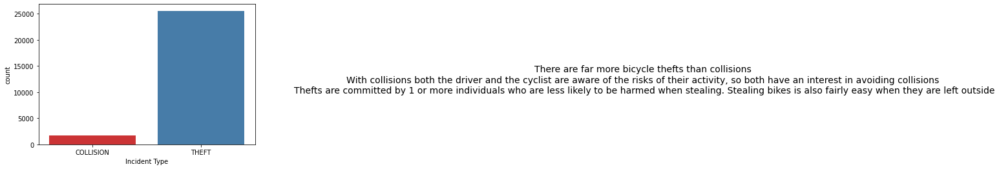

In [ ]:
# Compare Collision instances vs. Theft
sns.countplot(x='Incident Type', data=full, palette='Set1')
plt.annotate('There are far more bicycle thefts than collisions \n' 
             'With collisions both the driver and the cyclist are aware of the risks of their activity, so both have an interest in avoiding collisions \n' 
             'Thefts are committed by 1 or more individuals who are less likely to be harmed when stealing. Stealing bikes is also fairly easy when they are left outside',
             xy=(2.8, 0.4), xytext=(0, 10),
             xycoords=('axes fraction', 'figure fraction'),
             textcoords='offset points',
             size=14, ha='center', va='bottom')

Text(0, 10, 'The most thefts and collisions occur at police divisions 14, 51 and 52 \nThese areas may be more populated or closer to more major arterial roads, or near places of that attract visitors')

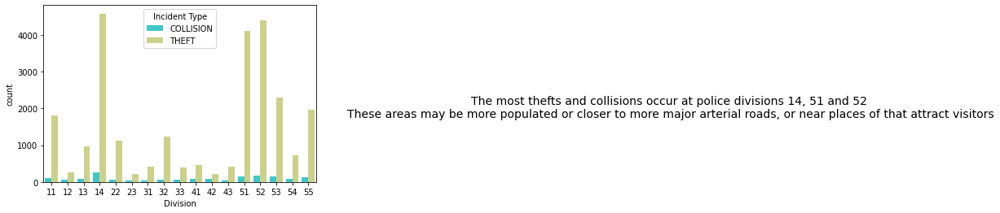

In [ ]:
# Visualize the bicycle incidents based on Toronto police division
sns.countplot(x='Division', hue='Incident Type', data=full, palette='rainbow')
plt.annotate('The most thefts and collisions occur at police divisions 14, 51 and 52 \n' 
             'These areas may be more populated or closer to more major arterial roads, or near places of that attract visitors',
             xy=(2.3, 0.4), xytext=(0, 10),
             xycoords=('axes fraction', 'figure fraction'),
             textcoords='offset points',
             size=14, ha='center', va='bottom')

Text(0, 10, 'Most collisions occur between 2010 and 2015. The amount of collisions decreases as you reach 2019 \nThis could be due to more awareness or safety procedures put in place by the city of Toronto \nThe majority of thefts occur between 2016 and 2019 \nVery few occurred before 2014, likely due to lack of data collection or storage')

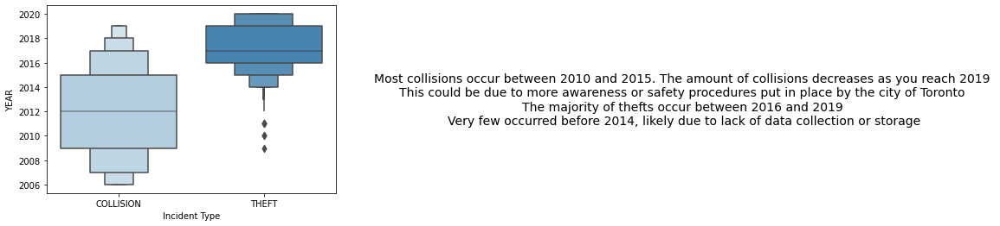

In [ ]:
# Compare collisions and thefts by year
sns.boxenplot(y='YEAR', x='Incident Type', data=full, palette= 'Blues')
plt.annotate('Most collisions occur between 2010 and 2015. The amount of collisions decreases as you reach 2019 \n' 
             'This could be due to more awareness or safety procedures put in place by the city of Toronto \n' 
             'The majority of thefts occur between 2016 and 2019 \n'
             'Very few occurred before 2014, likely due to lack of data collection or storage',
             xy=(2.2, 0.4), xytext=(0, 10),
             xycoords=('axes fraction', 'figure fraction'),
             textcoords='offset points',
             size=14, ha='center', va='bottom')

Text(0, 10, 'Both thefts and collisions peak between 5PM-7PM \nThere is a more even distribution of thefts throughout the day compared to collisions \nThis uneven distribuition in collisions could be explained by the lack of vehicles on the road during typical work hours (9AM-5PM) \nThere does not need to be anybody driving on the road for a bicycle theft to occur so there are more opportunities, thus a more even distribution')

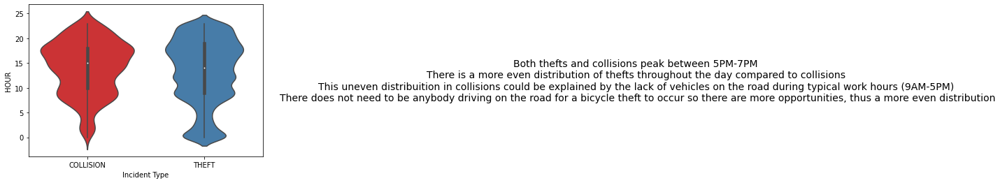

In [ ]:
# Compare what hour in the day collisions and thefts occur
sns.violinplot(x='Incident Type', y='HOUR', data=full, palette= 'Set1')
plt.annotate('Both thefts and collisions peak between 5PM-7PM \n' 
             'There is a more even distribution of thefts throughout the day compared to collisions \n' 
             'This uneven distribuition in collisions could be explained by the lack of vehicles on the road during typical work hours (9AM-5PM) \n' 
             'There does not need to be anybody driving on the road for a bicycle theft to occur so there are more opportunities, thus a more even distribution',
             xy=(2.6, 0.4), xytext=(0, 10),
             xycoords=('axes fraction', 'figure fraction'),
             textcoords='offset points',
             size=14, ha='center', va='bottom')

In [ ]:
list(full.columns.values)

['YEAR',
 'DATE',
 'TIME',
 'HOUR',
 'ROAD_CLASS',
 'District',
 'Division',
 'LATITUDE',
 'LONGITUDE',
 'LOCCOORD',
 'ACCLOC',
 'TRAFFCTL',
 'VISIBILITY',
 'LIGHT',
 'RDSFCOND',
 'ACCLASS',
 'IMPACTYPE',
 'INVTYPE',
 'INVAGE',
 'INJURY',
 'VEHTYPE',
 'MANOEUVER',
 'DRIVACT',
 'PEDESTRIAN',
 'SPEEDING',
 'AG_DRIV',
 'REDLIGHT',
 'ALCOHOL',
 'Neighbourhood',
 'Incident Type',
 'Vehicle Type',
 'MONTH',
 'DAY',
 'Primary_Offence',
 'Location_Type',
 'Premises_Type',
 'Bike_Type',
 'Bike_Colour',
 'Cost_of_Bike',
 'Status']

In [ ]:
# Create final clean dataframe
# Re-order the columns to group related columns
clean_df = full[['DATE','YEAR','MONTH','DAY', 'HOUR', 'ROAD_CLASS', 'District', 'Division', 'LATITUDE', 'LONGITUDE', 'LOCCOORD', 'ACCLOC', 
                'TRAFFCTL', 'VISIBILITY', 'LIGHT', 'RDSFCOND', 'ACCLASS', 'IMPACTYPE', 'INVTYPE', 'INVAGE', 'INJURY', 'VEHTYPE', 
                'MANOEUVER', 'DRIVACT', 'PEDESTRIAN', 'SPEEDING', 'AG_DRIV', 'REDLIGHT', 'ALCOHOL', 
                'Neighbourhood', 'Incident Type', 'Vehicle Type', 'Primary_Offence','Location_Type',
                'Premises_Type','Bike_Type','Cost_of_Bike','Status']]

In [ ]:
clean_df = clean_df.rename(columns={"ROAD_CLASS" : "ROAD CLASS",'District' : 'DISTRICT', 'Division' : 'POLICE DIVISION','Neighbourhood' : 'NEIGHBOURHOOD',
                              "Incident Type" : "INCIDENT TYPE", "Vehicle Type":"VEHICLE TYPE", "Primary_Offence":"PRIMARY OFFENCE", 'Location_Type':'LOCATION TYPE',
                              'Premises_Type':'PREMISES TYPE', 'Bike_Type': 'BIKE TYPE', 'Cost_of_Bike': 'COST OF BIKE', 'Status':'STATUS'})

In [ ]:
clean_df.head(1)

,DATE,YEAR,MONTH,DAY,HOUR,ROAD CLASS,DISTRICT,POLICE DIVISION,LATITUDE,LONGITUDE,LOCCOORD,ACCLOC,TRAFFCTL,VISIBILITY,LIGHT,RDSFCOND,ACCLASS,IMPACTYPE,INVTYPE,INVAGE,INJURY,VEHTYPE,MANOEUVER,DRIVACT,PEDESTRIAN,SPEEDING,AG_DRIV,REDLIGHT,ALCOHOL,NEIGHBOURHOOD,INCIDENT TYPE,VEHICLE TYPE,PRIMARY OFFENCE,LOCATION TYPE,PREMISES TYPE,BIKE TYPE,COST OF BIKE,STATUS
0,2006-02-11,2006,February,Saturday,18,Collector,North York,33,43.752745,-79.32639,Intersection,At Intersection,No Control,Clear,Dark,Dry,Non-Fatal Injury,Cyclist Collisions,Driver,65 to 69,None,"Automobile, Station Wagon",Turning Left,Improper Turn,No,No,No,No,No,Parkwoods-Donalda (45),COLLISION,AUTOMOBILE,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
from google.colab import files
clean_df.to_csv('clean.csv') 
files.download('clean.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

# **Modelling**

# *Cluster Analysis*

Elbow Method to determine number of Clusters:

Elbow method explored to identify optimized cluster number. 'SPEEDING', 'AG_DRIV', 'REDLIGHT', 'ALCOHOL' used as input and aggregate of these numbers as output to further investigate and identify which neighbourhood has highest numbers of accident related to input condition.

In [ ]:
drop_colmns = ['YEAR', 'HOUR', 'LATITUDE', 'LONGITUDE', 'Division',  'ROAD_CLASS',
       'LOCCOORD', 'ACCLOC', 'TRAFFCTL', 'VISIBILITY', 'LIGHT', 'RDSFCOND', 'ACCLASS', 'IMPACTYPE', 'INVTYPE', 
       'INVAGE', 'INJURY', 'VEHTYPE', 'MANOEUVER', 'DRIVACT', 'PEDESTRIAN']

df1 = cycle.drop(columns=drop_colmns)

In [ ]:
# Install required libraries

import seaborn as sns
import statsmodels.formula.api as smf
from sklearn.linear_model import LinearRegression
from sklearn import metrics
from sklearn.model_selection  import train_test_split
from scipy.stats import norm # for scientific Computing
from scipy import stats, integrate
import matplotlib.pyplot as plt
import matplotlib

from sklearn.datasets import fetch_openml
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn import metrics
from sklearn.model_selection import train_test_split
from sklearn.cluster import KMeans

In [ ]:
df1_g2 = df1.groupby(['Neighbourhood','SPEEDING']).size().to_frame('count').reset_index()
df1speed = df1_g2.pivot(index='Neighbourhood',columns='SPEEDING',values='count')

df1_g2 = df1.groupby(['Neighbourhood','AG_DRIV']).size().to_frame('count').reset_index()
df1agdriv = df1_g2.pivot(index='Neighbourhood',columns='AG_DRIV',values='count')

df1_g2 = df1.groupby(['Neighbourhood','REDLIGHT']).size().to_frame('count').reset_index()
df1red = df1_g2.pivot(index='Neighbourhood',columns='REDLIGHT',values='count')

df1_g2 = df1.groupby(['Neighbourhood','ALCOHOL']).size().to_frame('count').reset_index()
df1alco = df1_g2.pivot(index='Neighbourhood',columns='ALCOHOL',values='count')

df1speed = df1speed.drop(df1speed.columns[0], axis=1)
df1speed[2] = df1agdriv.drop(df1agdriv.columns[0], axis=1)
df1speed[3] = df1red.drop(df1red.columns[0], axis=1)
df1speed[4] = df1alco.drop(df1alco.columns[0], axis=1)

df1speed.columns.names = ['Cause'] 
df1 = df1speed
df1 = df1.dropna()

df1.columns = ['SPEEDING', 'AG_DRIV', 'REDLIGHT', 'ALCOHOL']

In [ ]:
scaler = StandardScaler()
Sum_of_squared_distances = []
std_scale = scaler.fit(df1)
df_transformed = std_scale.transform(df1)
pca = PCA(n_components=1)
pca = pca.fit(df_transformed)
X = pca.transform(df_transformed)

K = range(1,5)
for k in K:
  km = KMeans(n_clusters=k)
  km = km.fit(df_transformed.reshape(-1,1))
  Sum_of_squared_distances.append(km.inertia_)

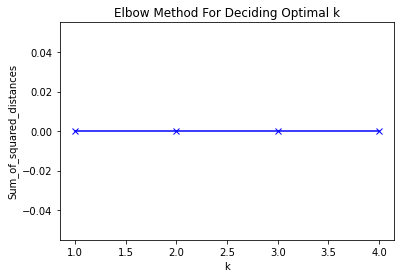

In [ ]:
plt.plot(K, Sum_of_squared_distances, 'bx-')
plt.xlabel('k')
plt.ylabel('Sum_of_squared_distances')
plt.title('Elbow Method For Deciding Optimal k')
plt.show()

Thus, we would be taking 4 clusters for our analysis.





Cluster analysis using K-means in general: 

K-mean applied to all columns besides those mentioned above using district instead of neighbourhood.

In [ ]:
# import KMeans
from sklearn.cluster import KMeans

In [ ]:
cycle_data_cluster = cycle[['YEAR', 'HOUR', 'District', 'VISIBILITY', 'LIGHT', 'RDSFCOND', 'PEDESTRIAN', 'SPEEDING', 
                            'AG_DRIV', 'REDLIGHT', 'ALCOHOL']]

In [ ]:
cycle_data_cluster = pd.get_dummies(cycle_data_cluster, columns=['VISIBILITY','RDSFCOND','LIGHT','District'])

In [ ]:
cycle_data_cluster.shape

(1681, 28)

In [ ]:
#Converting to float

for n,v in cycle_data_cluster.items():
    if v.dtype == "object":
        cycle_data_cluster[n] = v.factorize()[0]

In [ ]:
# create kmeans object
kmeans = KMeans(n_clusters=4)

# fit kmeans object to data
kmeans.fit(cycle_data_cluster)

# location of clusters learned by kmeans object
cluster_center = pd.DataFrame(kmeans.cluster_centers_,columns = cycle_data_cluster.columns)
print(cluster_center)

# save new clusters 
y_km = kmeans.fit_predict(cycle_data_cluster)

          YEAR       HOUR  ...  District_Scarborough  District_Toronto and East York
0  2013.895652   6.484058  ...              0.150725                        0.669565
1  2009.526906  19.065022  ...              0.134529                        0.634529
2  2016.080000  17.035789  ...              0.107368                        0.606316
3  2009.438554  11.696386  ...              0.134940                        0.657831

[4 rows x 28 columns]


In [ ]:
cluster_center.describe()

,YEAR,HOUR,PEDESTRIAN,SPEEDING,AG_DRIV,REDLIGHT,ALCOHOL,VISIBILITY_Clear,VISIBILITY_Drifting Snow,VISIBILITY_Other,VISIBILITY_Rain,VISIBILITY_Snow,RDSFCOND_Dry,RDSFCOND_Loose Snow,RDSFCOND_Other,RDSFCOND_Wet,LIGHT_Dark,"LIGHT_Dark, artificial",LIGHT_Dawn,"LIGHT_Dawn, artificial",LIGHT_Daylight,"LIGHT_Daylight, artificial",LIGHT_Dusk,"LIGHT_Dusk, artificial",District_Etobicoke York,District_North York,District_Scarborough,District_Toronto and East York
count,4.000000,4.000000,4.000000e+00,4.000000,4.000000,4.000000,4.000000e+00,4.000000,4.000000e+00,4.000000e+00,4.000000,4.000000e+00,4.000000,4.000000e+00,4.000000e+00,4.000000,4.000000,4.000000e+00,4.000000e+00,4.000000e+00,4.000000,4.000000e+00,4.000000e+00,4.000000e+00,4.000000,4.000000,4.000000,4.000000
mean,2012.235278,13.570314,1.914113e-02,0.029707,0.359495,0.032457,1.241367e-02,0.920328,1.449275e-03,5.133486e-03,0.070680,2.409639e-03,0.890827,2.654095e-03,2.501907e-03,0.104017,0.131757,1.241569e-01,2.898551e-03,6.521739e-03,0.684970,1.165523e-02,2.265282e-02,1.538707e-02,0.115006,0.109990,0.131890,0.642060
std,3.301296,5.654732,2.012938e-02,0.010359,0.044957,0.011730,9.218725e-03,0.025934,2.898551e-03,6.961087e-03,0.020698,4.819277e-03,0.036147,3.090574e-03,2.960674e-03,0.031575,0.158542,1.015555e-01,5.797101e-03,1.304348e-02,0.219009,1.517004e-02,2.726717e-02,2.022203e-02,0.020802,0.024642,0.018003,0.027926
min,2009.438554,6.484058,-1.144917e-16,0.016867,0.293976,0.021687,8.673617e-18,0.890526,-1.322727e-17,-2.428613e-17,0.053012,-2.645453e-17,0.840580,-2.645453e-17,-2.471981e-17,0.076233,0.004819,9.714451e-17,-2.645453e-17,-2.602085e-17,0.486547,-4.857226e-17,1.734723e-17,5.898060e-17,0.101205,0.078261,0.107368,0.606316
25%,2009.504818,10.393304,3.157895e-03,0.023782,0.349279,0.024987,8.408072e-03,0.903066,-1.257675e-17,-2.233456e-17,0.053612,-2.515349e-17,0.878040,-2.515349e-17,-2.341877e-17,0.084119,0.016994,6.558296e-02,-2.515349e-17,-2.471981e-17,0.569463,-4.466913e-17,1.734723e-17,9.020562e-17,0.101388,0.099083,0.127739,0.627476
50%,2011.711279,14.366088,1.780033e-02,0.030981,0.375161,0.029860,1.430103e-02,0.922298,-1.192622e-17,2.898551e-03,0.067486,-2.103352e-17,0.899480,2.409639e-03,2.105263e-03,0.096005,0.087338,1.335770e-01,-2.385245e-17,-2.298509e-17,0.629077,7.368421e-03,1.793722e-02,9.473684e-03,0.106778,0.112429,0.134734,0.646180
75%,2014.441739,17.543098,3.378356e-02,0.036906,0.385378,0.037329,1.830664e-02,0.939559,1.449275e-03,8.032037e-03,0.084554,2.409639e-03,0.912267,5.063733e-03,4.607170e-03,0.115904,0.202101,1.921510e-01,2.898551e-03,6.521739e-03,0.744585,1.902365e-02,4.059004e-02,2.486075e-02,0.120397,0.123336,0.138886,0.660765
max,2016.080000,19.065022,4.096386e-02,0.040000,0.393684,0.048421,2.105263e-02,0.946188,5.797101e-03,1.473684e-02,0.094737,9.638554e-03,0.923767,5.797101e-03,5.797101e-03,0.147826,0.347534,2.294737e-01,1.159420e-02,2.608696e-02,0.995181,3.188406e-02,5.473684e-02,4.260090e-02,0.145263,0.136842,0.150725,0.669565


Cluster analysis using Kmeans checking neighborhood using raw data with selected columns: 

'SPEEDING', 'AG_DRIV' selected for investigation of Neighborhood



In [ ]:
drop_colmns = ['YEAR', 'HOUR', 'LATITUDE', 'LONGITUDE', 'Division', 'ROAD_CLASS',
       'LOCCOORD', 'ACCLOC', 'TRAFFCTL', 'VISIBILITY', 'LIGHT', 'RDSFCOND',
       'ACCLASS', 'IMPACTYPE', 'INVTYPE', 'INVAGE', 'INJURY',  'VEHTYPE', 'MANOEUVER', 'DRIVACT', 'PEDESTRIAN']

dk = cycle.drop(columns=drop_colmns)
dk.columns

Index(['DATE', 'TIME', 'District', 'SPEEDING', 'AG_DRIV', 'REDLIGHT',
       'ALCOHOL', 'Neighbourhood', 'Incident Type', 'Vehicle Type', 'MONTH',
       'DAY'],
      dtype='object')

In [ ]:
dk_g2=dk.groupby(['District','SPEEDING']).size().to_frame('count').reset_index()
dkspeed = dk_g2.pivot(index='District',columns='SPEEDING',values='count')

dk_g2=dk.groupby(['District','AG_DRIV']).size().to_frame('count').reset_index()
dkagdriv = dk_g2.pivot(index='District',columns='AG_DRIV',values='count')

dk_g2=dk.groupby(['District','REDLIGHT']).size().to_frame('count').reset_index()
dfred = dk_g2.pivot(index='District',columns='REDLIGHT',values='count')

dk_g2=dk.groupby(['District','ALCOHOL']).size().to_frame('count').reset_index()
dkalco = dk_g2.pivot(index='District',columns='ALCOHOL',values='count')

dknew = dkspeed
dknew.columns.names = ['Cause'] 
dknew = dknew.dropna()
dknew.columns = ['SPEEDING', 'AG_DRIV']
dknew.nlargest(10,'SPEEDING')

,SPEEDING,AG_DRIV
District,,
Toronto and East York,1049,26
Scarborough,200,19
Etobicoke York,192,4
North York,187,2


In [ ]:
dk_g2=dk.groupby(['District','SPEEDING']).size().to_frame('count').reset_index()
dk_g2

,District,SPEEDING,count
0,Etobicoke York,No,192
1,Etobicoke York,Yes,4
2,North York,No,187
3,North York,Yes,2
4,Scarborough,No,200
5,Scarborough,Yes,19
6,Toronto and East York,No,1049
7,Toronto and East York,Yes,26


Index([0, 1, 'label'], dtype='object')


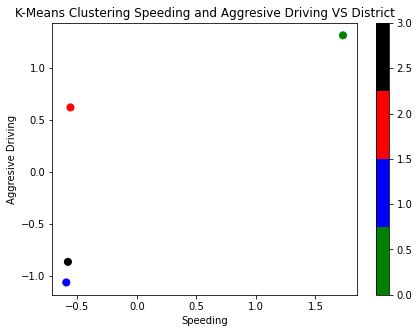

In [ ]:
scaler = StandardScaler()
Sum_of_squared_distances = []
std_scale = scaler.fit(dknew)
dk_transformed = std_scale.transform(dknew)
from sklearn.cluster import KMeans
kmeansk = KMeans(n_clusters=4,random_state=3425)
colors = ['green','blue','red','black']


plt.figure(figsize=(15, 5)) 

ax = plt.subplot(121)
kc =kmeansk.fit(dk_transformed)
label = pd.DataFrame(kc.labels_)
dk_result =pd.DataFrame(dk_transformed)
# label = label.sort_values(by=0)
dk_result['label']=label
print(dk_result.columns)
scatterd = plt.scatter(dk_result[0],dk_result[1],
                     c=list(label.iloc[:,0]), cmap=matplotlib.colors.ListedColormap(colors),s=50)
plt.title('K-Means Clustering Speeding and Aggresive Driving VS District')
plt.xlabel('Speeding')
plt.ylabel('Aggresive Driving')
plt.colorbar(scatterd)

In [ ]:
print('Highest number of accidents causing fatalities by speeding and aggresive driving in Toronto from 2007-2017, based on Kmeans, occured in')
neighborhoodsk = dknew.index
neighborhoodsk = np.array(neighborhoodsk)
print(neighborhoodsk[np.where(label[0]==1)])

Highest number of accidents causing fatalities by speeding and aggresive driving in Toronto from 2007-2017, based on Kmeans, occured in
['North York']


In [ ]:
ClusterLabelk=pd.DataFrame(kmeansk.labels_) 
ClusterLabelk['label']=dknew.index
ClusterLabelk

,0,label
0,3,Etobicoke York
1,1,North York
2,2,Scarborough
3,0,Toronto and East York


In [ ]:
drop_colmns = ['YEAR', 'HOUR', 'LATITUDE', 'LONGITUDE', 'Division',  'ROAD_CLASS',
       'LOCCOORD', 'ACCLOC', 'TRAFFCTL', 'VISIBILITY', 'LIGHT', 'RDSFCOND', 'ACCLASS', 'IMPACTYPE', 'INVTYPE', 
        'INVAGE', 'INJURY', 'VEHTYPE', 'MANOEUVER', 'DRIVACT', 'PEDESTRIAN']

df = cycle.drop(columns=drop_colmns)
df.columns

Index(['DATE', 'TIME', 'District', 'SPEEDING', 'AG_DRIV', 'REDLIGHT',
       'ALCOHOL', 'Neighbourhood', 'Incident Type', 'Vehicle Type', 'MONTH',
       'DAY'],
      dtype='object')

In [ ]:
df_g2=df.groupby(['Neighbourhood','SPEEDING']).size().to_frame('count').reset_index()
dfspeed = df_g2.pivot(index='Neighbourhood',columns='SPEEDING',values='count')

df_g2=df.groupby(['Neighbourhood','AG_DRIV']).size().to_frame('count').reset_index()
dfagdriv = df_g2.pivot(index='Neighbourhood',columns='AG_DRIV',values='count')

df_g2=df.groupby(['Neighbourhood','REDLIGHT']).size().to_frame('count').reset_index()
dfred = df_g2.pivot(index='Neighbourhood',columns='REDLIGHT',values='count')

df_g2=df.groupby(['Neighbourhood','ALCOHOL']).size().to_frame('count').reset_index()
dfalco = df_g2.pivot(index='Neighbourhood',columns='ALCOHOL',values='count')


In [ ]:
dfnew = dfspeed

dfnew.columns.names = ['Cause'] 
dfnew = dfnew.dropna()
dfnew.columns = ['SPEEDING', 'AG_DRIV']
dfnew.nlargest(10,'SPEEDING')

,SPEEDING,AG_DRIV
Neighbourhood,,
Bay Street Corridor (76),80.0,5.0
Trinity-Bellwoods (81),48.0,2.0
Dufferin Grove (83),45.0,12.0
University (79),38.0,2.0
Moss Park (73),33.0,2.0
Little Portugal (84),17.0,3.0
York University Heights (27),12.0,2.0
Birchcliffe-Cliffside (122),11.0,4.0
Woburn (137),8.0,2.0


From the table it can be seen that Bay Street Corridor (76), Trinity-Bellwoods (81), and Dufferin Grove (83) rank top 3 out of all neighbourhoods for fatalities.

In [ ]:
scaler = StandardScaler()
Sum_of_squared_distances = []
std_scale = scaler.fit(dfnew)
df_transformed = std_scale.transform(dfnew)

Index([0, 1, 'label'], dtype='object')


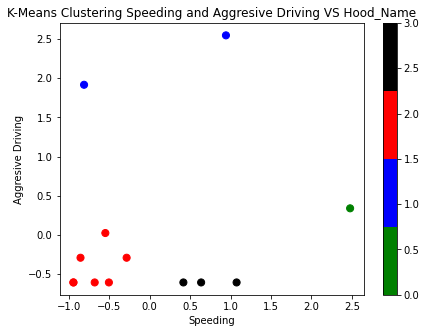

In [ ]:
kmeans = KMeans(n_clusters=4,random_state=3425)
colors =  ['green','blue','red','black']


plt.figure(figsize=(15, 5)) 

ax = plt.subplot(121)
kc =kmeans.fit(df_transformed)
label = pd.DataFrame(kc.labels_)
df_result =pd.DataFrame(df_transformed)
# label = label.sort_values(by=0)
df_result['label']=label
print(df_result.columns)
scatter = plt.scatter(df_result[0],df_result[1],
                     c=list(label.iloc[:,0]), cmap=matplotlib.colors.ListedColormap(colors),s=50)
plt.title('K-Means Clustering Speeding and Aggresive Driving VS Hood_Name')
plt.xlabel('Speeding')
plt.ylabel('Aggresive Driving')
plt.colorbar(scatter)

In [ ]:
ClusterLabelh=pd.DataFrame(kmeans.labels_) 
ClusterLabelh['label']=dfnew.index
ClusterLabelh.head(5)

,0,label
0,0,Bay Street Corridor (76)
1,2,Birchcliffe-Cliffside (122)
2,2,Brookhaven-Amesbury (30)
3,1,Dorset Park (126)
4,1,Dufferin Grove (83)


In [ ]:
print('Highest number of accidents causing fatalities in Toronto Neighborhoods from 2007-2017, based on Kmeans, occured in')
neighborhoods = dfnew.index
neighborhoods = np.array(neighborhoods)
print(neighborhoods[np.where(label[0]==2)])

Highest number of accidents causing fatalities in Toronto Neighborhoods from 2007-2017, based on Kmeans, occured in
['Birchcliffe-Cliffside (122)' 'Brookhaven-Amesbury (30)'
 'Glenfield-Jane Heights (25)' 'Little Portugal (84)' 'Malvern (132)'
 'Woburn (137)' 'York University Heights (27)']


In [ ]:
dfnew.nlargest(3,'SPEEDING')

,SPEEDING,AG_DRIV
Neighbourhood,,
Bay Street Corridor (76),80.0,5.0
Trinity-Bellwoods (81),48.0,2.0
Dufferin Grove (83),45.0,12.0


In [ ]:
dfnew.nsmallest(10,'SPEEDING')

,SPEEDING,AG_DRIV
Neighbourhood,,
Brookhaven-Amesbury (30),2.0,2.0
Glenfield-Jane Heights (25),2.0,2.0
Malvern (132),4.0,3.0
Dorset Park (126),5.0,10.0
Woburn (137),8.0,2.0
Birchcliffe-Cliffside (122),11.0,4.0
York University Heights (27),12.0,2.0
Little Portugal (84),17.0,3.0
Moss Park (73),33.0,2.0


From the relative pivot table for speeding and aggressive fatal numbers, least accidents are reported in the neighbourhoods of 'Brookhaven-Amesbury (30)', 'Glenfield-Jane Heights (25)', 'Malvern (132)'

Hierarchical Cluster Analysis using Dendrogram:



In [ ]:
cycle_data_clusterHieCluster = cycle[['YEAR', 'Neighbourhood', 'SPEEDING', 'AG_DRIV', 'REDLIGHT', 'ALCOHOL',
                                      'VISIBILITY', 'LIGHT', 'RDSFCOND']]

cycle_data_clusterHieCluster = pd.get_dummies(cycle_data_clusterHieCluster, columns=['VISIBILITY','RDSFCOND','LIGHT','Neighbourhood'])

In [ ]:
# import libraries
import scipy.cluster.hierarchy as sch
from sklearn.cluster import AgglomerativeClustering

In [ ]:
#Convert datatype to float

for n,v in cycle_data_clusterHieCluster.items():
    if v.dtype == "object":
        cycle_data_clusterHieCluster[n] = v.factorize()[0]

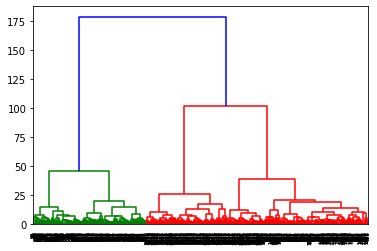

In [ ]:
# create dendrogram
dendrogram = sch.dendrogram(sch.linkage(cycle_data_clusterHieCluster, method='ward'))

# create clusters
hc = AgglomerativeClustering(n_clusters=4, affinity = 'euclidean', linkage = 'ward')

# save clusters for chart
y_hcm = hc.fit_predict(cycle_data_clusterHieCluster )

4 clusters were identified by K-means Clustering.

Neighbourhood mapped to 4 clusters based on K-means clusters and applied to the modeling with factors affecting the condition causing fatal injury.

The columns 'YEAR' and 'MONTH' kept while columns 'HOUR', 'MINUTES', 'WEEKDAY', 'PEDESTRIAN', 'AUTOMOBILE', 'TRUCK','TRSN_CITY_VEH', 'PASSENGER' dropped.

'Hood_ID' replaced by Neighbourhood name that would be mapped in 4 clusters.

In [ ]:
# Make a copy of the cycle dataset

cycle2 = cycle.copy()

In [ ]:
cycle2.head(5)

,YEAR,DATE,TIME,HOUR,ROAD_CLASS,District,Division,LATITUDE,LONGITUDE,LOCCOORD,ACCLOC,TRAFFCTL,VISIBILITY,LIGHT,RDSFCOND,ACCLASS,IMPACTYPE,INVTYPE,INVAGE,INJURY,VEHTYPE,MANOEUVER,DRIVACT,PEDESTRIAN,SPEEDING,AG_DRIV,REDLIGHT,ALCOHOL,Neighbourhood,Incident Type,Vehicle Type,MONTH,DAY
0,2006,2006-02-11,1804,18,Collector,North York,33,43.752745,-79.32639,Intersection,At Intersection,No Control,Clear,Dark,Dry,Non-Fatal Injury,Cyclist Collisions,Driver,65 to 69,None,"Automobile, Station Wagon",Turning Left,Improper Turn,No,No,No,No,No,Parkwoods-Donalda (45),COLLISION,AUTOMOBILE,February,Saturday
1,2006,2006-02-11,1804,18,Collector,North York,33,43.752745,-79.32639,Intersection,At Intersection,No Control,Clear,Dark,Dry,Non-Fatal Injury,Cyclist Collisions,Cyclist,20 to 24,Major,Bicycle,Going Ahead,NaN,No,No,No,No,No,Parkwoods-Donalda (45),COLLISION,AUTOMOBILE,February,Saturday
2,2006,2006-02-27,1955,19,Major Arterial,Scarborough,43,43.770645,-79.18689,Intersection,NaN,Traffic Signal,Clear,Dark,Wet,Non-Fatal Injury,Cyclist Collisions,Vehicle Owner,unknown,NaN,Other,NaN,NaN,No,No,Yes,No,No,West Hill (136),COLLISION,TRANSIT OR CITY VEHICLE,February,Monday
3,2006,2006-02-27,1955,19,Major Arterial,Scarborough,43,43.770645,-79.18689,Intersection,NaN,Traffic Signal,Clear,Dark,Wet,Non-Fatal Injury,Cyclist Collisions,Driver,35 to 39,None,Municipal Transit Bus (TTC),Turning Right,Failed to Yield Right of Way,No,No,Yes,No,No,West Hill (136),COLLISION,TRANSIT OR CITY VEHICLE,February,Monday
4,2006,2006-02-27,1955,19,Major Arterial,Scarborough,43,43.770645,-79.18689,Intersection,NaN,Traffic Signal,Clear,Dark,Wet,Non-Fatal Injury,Cyclist Collisions,Cyclist,25 to 29,Major,Bicycle,Going Ahead,NaN,No,No,Yes,No,No,West Hill (136),COLLISION,TRANSIT OR CITY VEHICLE,February,Monday


In [ ]:
cycle_neighbourhoodmap2 = cycle2[['Neighbourhood', 'YEAR', 'MONTH','DAY',
        'VISIBILITY','RDSFCOND','LIGHT',
        'SPEEDING', 'AG_DRIV', 'REDLIGHT', 'ALCOHOL', 'ACCLASS']]

cycle_neighbourhoodmap2['Neighbourhood'] = cycle_neighbourhoodmap2['Neighbourhood'].map({'Bendale (127)' :'Cluster4',
         "L'Amoreaux (117)":'Cluster4',  'Clairlea-Birchmount (120)' :'Cluster4','Clanton Park (33)' :'Cluster4',
        'Malvern (132)':'Cluster4','Don Valley Village (47)' :'Cluster4', 'Kensington-Chinatown (78)' :'Cluster4',
'Moss Park (73)':'Cluster4','Newtonbrook West (36)' :'Cluster4',  'Rosedale-Moore Park (98)' :'Cluster4',
"Tam O'Shanter-Sullivan (118)":'Cluster4','Trinity-Bellwoods (81)' :'Cluster4',  'Waterfront Communities-The Island (77)' :'Cluster4',                                                                            
'Woburn (137)':'Cluster4','Yonge-St.Clair (97)' :'Cluster4',
                                                                             
'South Parkdale (85)':'Cluster3','West Humber-Clairville (1)' :'Cluster3',  'Wexford/Maryvale (119)'  :'Cluster3',  
                                                                             
'Agincourt North (129)':'Cluster2','Newtonbrook West (36)' :'Cluster2',  'Rosedale-Moore Park (98)' :'Cluster2',                                                                            
 'Bay Street Corridor (76)':'Cluster2','Agincourt South-Malvern West (128)' :'Cluster2',  'Banbury-Don Mills (42)':'Cluster2',                                                                           
'Bayview Village (52)' :'Cluster2','Bedford Park-Nortown (39)' :'Cluster2',  'Birchcliffe-Cliffside (122)' :'Cluster2', 
'Cabbagetown-South St.James Town (71)':'Cluster2','Caledonia-Fairbank (109)' :'Cluster2',   'Cliffcrest (123)' :'Cluster2',                                                                             
'Corso Italia-Davenport (92)':'Cluster2','Danforth East York (59)' :'Cluster2',  'Dorset Park (126)' :'Cluster2',
 'Dovercourt-Wallace Emerson-Junction (93)':'Cluster2', 'Downsview-Roding-CFB (26)':'Cluster2',  'Eglinton East (138)' :'Cluster2',                                                                             
'Flemingdon Park (44)':'Cluster2', 'High Park-Swansea (87)':'Cluster2',   'Humber Heights-Westmount (8)':'Cluster2',
'Humber Summit (21)':'Cluster2',  'Humbermede (22)':'Cluster2',  'Ionview (125)':'Cluster2',                                                                           
'Islington-City Centre West (14)' :'Cluster2', 'Kennedy Park (124)':'Cluster2',   'Lawrence Park South (103)' :'Cluster2',
 'Lawrence Park South (103)':'Cluster2',                                                                          
 'Newtonbrook East (50)':'Cluster2',  'Little Portugal (84)':'Cluster2',   'The Beaches (63)':'Cluster2',                                                                               
 'Rexdale-Kipling (4)':'Cluster2',    'Milliken (130)':'Cluster2',                                                                               
 'Roncesvalles (86)':'Cluster2','Rockcliffe-Smythe (111)' :'Cluster2',                                                                                
 'Rouge (131)':'Cluster2', 'Scarborough Village (139)':'Cluster2',   'South Riverdale (70)':'Cluster2',  
 'Steeles (116)':'Cluster2',   'Willowdale East (51)':'Cluster2', 'Westminster-Branson (35)' :'Cluster2',                                                                               
'York University Heights (27)':'Cluster2',                                                                              

                                                                             
'Alderwood (20)' :'Cluster1', 'Annex (95)':'Cluster1',  'Bathurst Manor (34)'  :'Cluster1',                                                                              
'Black Creek (24)' :'Cluster1', 'Broadview North (57)':'Cluster1',   'Brookhaven-Amesbury (30)':'Cluster1',                                                                                
'Casa Loma (96)' :'Cluster1', 'Centennial Scarborough (133)':'Cluster1',   'Church-Yonge Corridor (75)':'Cluster1',                                                                              
 'Dufferin Grove (83)':'Cluster1', 'Edenbridge-Humber Valley (9)':'Cluster1','Elms-Old Rexdale (5)':'Cluster1',                                                                             
 'Englemount-Lawrence (32)':'Cluster1',  'Forest Hill South (101)':'Cluster1',   'Glenfield-Jane Heights (25)' :'Cluster1', 
'Greenwood-Coxwell (65)':'Cluster1', 'Henry Farm (53)':'Cluster1',   'High Park North (88)':'Cluster1',                                                                              
'Highland Creek (134)' :'Cluster1', 'Hillcrest Village (48)':'Cluster1',  'Humewood-Cedarvale (106)' :'Cluster1',                                                                              
 'Junction Area (90)':'Cluster1', 'Keelesdale-Eglinton West (110)':'Cluster1',                                                                               
 'Lansing-Westgate (38)' :'Cluster1', 'Leaside-Bennington (56)' :'Cluster1',   'Lawrence Park North (105)':'Cluster1',                                                                             
 'Long Branch (19)':'Cluster1', 'Maple Leaf (29)':'Cluster1',  'Markland Wood (12)' :'Cluster1',                                                                             
 'Mimico (includes Humber Bay Shores) (17)':'Cluster1', 'Morningside (135)' :'Cluster1',  'Mount Dennis (115)':'Cluster1',                                                                             
'Mount Olive-Silverstone-Jamestown (2)':'Cluster1',  'New Toronto (18)' :'Cluster1',   'North Riverdale (68)':'Cluster1', 
'North St.James Town (74)':'Cluster1', 'Oakwood Village (107)':'Cluster1',   'Old East York (58)':'Cluster1',                                                                              
 "O'Connor-Parkview (54)":'Cluster1', 'Pleasant View (46)' :'Cluster1',  'Parkwoods-Donalda (45)' :'Cluster1',                                                                             
 'Regent Park (72)':'Cluster1', 'Rustic (28)' :'Cluster1',   'St.Andrew-Windfields (40)':'Cluster1',                                                                             
  'Thistletown-Beaumond Heights (3)' :'Cluster1', 'University (79)':'Cluster1',  'Victoria Village (43)' :'Cluster1',                                                                             
 'Victoria Village (43)':'Cluster1', 'West Hill (136)' :'Cluster1',   'Weston (113)' :'Cluster1', 
 'Weston-Pellam Park (91)':'Cluster1',  'Willowdale West (37)':'Cluster1',   'Willowridge-Martingrove-Richview (7)' :'Cluster1', 
  'Yonge-Eglinton (100)' :'Cluster1'})

cycle_neighbourhoodmap1 = cycle_neighbourhoodmap2[['Neighbourhood', 'YEAR', 'MONTH',
        'VISIBILITY','RDSFCOND','LIGHT',
        'SPEEDING', 'AG_DRIV', 'REDLIGHT', 'ALCOHOL']]
cycle_neighbourhoodmap1['Neighbourhood'].nunique()

4

In [ ]:
# Import sklearn ensemble for Random Forest Classifier

import sklearn.ensemble as ske

In [ ]:
#Convert datatype to float

for n,v in cycle2.items():
    if v.dtype == "object":
        cycle2[n] = v.factorize()[0]

In [ ]:
# Divide into test and train data sets

cycle_neighbourhoodmap = pd.get_dummies(cycle_neighbourhoodmap1, columns=['VISIBILITY','RDSFCOND','LIGHT','Neighbourhood'])
cycle_target = cycle2[['ACCLASS']]

Xhm_train, Xhm_test, y_train,y_test = train_test_split(cycle_neighbourhoodmap, cycle_target, test_size=1/7.0, random_state=1)

In [ ]:
#Convert datatype to float

for n,v in Xhm_train.items():
    if v.dtype == "object":
        Xhm_train[n] = v.factorize()[0]

In [ ]:
# Run the Random Forest Regressor and fit the model. Also, find the score.

RFRhm = ske.RandomForestRegressor()
RFRhm.fit(Xhm_train,y_train)

scorehm = RFRhm.score(Xhm_train,y_train)
print(scorehm)

0.8784922101046219


The model score is 0.8784 on the training set

In [ ]:
cycle_neighbourhoodmap.columns

Index(['YEAR', 'MONTH', 'SPEEDING', 'AG_DRIV', 'REDLIGHT', 'ALCOHOL',
       'VISIBILITY_Clear', 'VISIBILITY_Drifting Snow', 'VISIBILITY_Other',
       'VISIBILITY_Rain', 'VISIBILITY_Snow', 'RDSFCOND_Dry',
       'RDSFCOND_Loose Snow', 'RDSFCOND_Other', 'RDSFCOND_Wet', 'LIGHT_Dark',
       'LIGHT_Dark, artificial', 'LIGHT_Dawn', 'LIGHT_Dawn, artificial',
       'LIGHT_Daylight', 'LIGHT_Daylight, artificial', 'LIGHT_Dusk',
       'LIGHT_Dusk, artificial', 'Neighbourhood_Cluster1',
       'Neighbourhood_Cluster2', 'Neighbourhood_Cluster3',
       'Neighbourhood_Cluster4'],
      dtype='object')

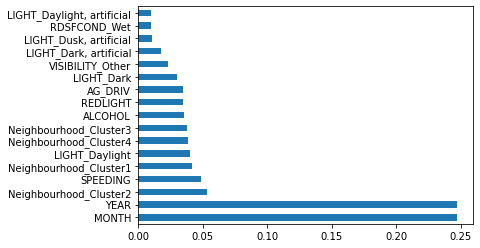

In [ ]:
# Find the Feature Importance

feat_importanceshnmap = pd.Series(RFRhm.feature_importances_, index=Xhm_train.columns)
feat_importanceshnmap.nlargest(17).plot(kind='barh')

In [ ]:
cycle_neighbourhoodmap3 = cycle_neighbourhoodmap2[['Neighbourhood', 'VISIBILITY', 'RDSFCOND', 'LIGHT',
       'SPEEDING', 'AG_DRIV', 'REDLIGHT', 'ALCOHOL', 'ACCLASS','YEAR', 'MONTH','DAY']]
cycle_neighbourhoodmap3 = pd.get_dummies(cycle_neighbourhoodmap3, columns=['VISIBILITY','RDSFCOND','LIGHT'])
cycle_neighbourhoodmap3.columns

Index(['Neighbourhood', 'SPEEDING', 'AG_DRIV', 'REDLIGHT', 'ALCOHOL',
       'ACCLASS', 'YEAR', 'MONTH', 'DAY', 'VISIBILITY_Clear',
       'VISIBILITY_Drifting Snow', 'VISIBILITY_Other', 'VISIBILITY_Rain',
       'VISIBILITY_Snow', 'RDSFCOND_Dry', 'RDSFCOND_Loose Snow',
       'RDSFCOND_Other', 'RDSFCOND_Wet', 'LIGHT_Dark',
       'LIGHT_Dark, artificial', 'LIGHT_Dawn', 'LIGHT_Dawn, artificial',
       'LIGHT_Daylight', 'LIGHT_Daylight, artificial', 'LIGHT_Dusk',
       'LIGHT_Dusk, artificial'],
      dtype='object')

In [ ]:
cycle_neighbourhoodmap3.head(5)

,Neighbourhood,SPEEDING,AG_DRIV,REDLIGHT,ALCOHOL,ACCLASS,YEAR,MONTH,DAY,VISIBILITY_Clear,VISIBILITY_Drifting Snow,VISIBILITY_Other,VISIBILITY_Rain,VISIBILITY_Snow,RDSFCOND_Dry,RDSFCOND_Loose Snow,RDSFCOND_Other,RDSFCOND_Wet,LIGHT_Dark,"LIGHT_Dark, artificial",LIGHT_Dawn,"LIGHT_Dawn, artificial",LIGHT_Daylight,"LIGHT_Daylight, artificial",LIGHT_Dusk,"LIGHT_Dusk, artificial"
0,Cluster1,No,No,No,No,Non-Fatal Injury,2006,February,Saturday,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0
1,Cluster1,No,No,No,No,Non-Fatal Injury,2006,February,Saturday,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0
2,Cluster1,No,Yes,No,No,Non-Fatal Injury,2006,February,Monday,1,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0
3,Cluster1,No,Yes,No,No,Non-Fatal Injury,2006,February,Monday,1,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0
4,Cluster1,No,Yes,No,No,Non-Fatal Injury,2006,February,Monday,1,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0


In [ ]:
# Convert Yes & No to 1 & 0 for SPEEDING, AG_DRIV, REDLIGHT, ALCOHOL

cycle_neighbourhoodmap3.SPEEDING = cycle_neighbourhoodmap3.SPEEDING.eq('Yes').mul(1)
cycle_neighbourhoodmap3.AG_DRIV = cycle_neighbourhoodmap3.AG_DRIV.eq('Yes').mul(1)
cycle_neighbourhoodmap3.REDLIGHT = cycle_neighbourhoodmap3.REDLIGHT.eq('Yes').mul(1)
cycle_neighbourhoodmap3.ALCOHOL = cycle_neighbourhoodmap3.ALCOHOL.eq('Yes').mul(1)

In [ ]:
cycle_neighbourhoodmap3.head(5)

,Neighbourhood,SPEEDING,AG_DRIV,REDLIGHT,ALCOHOL,ACCLASS,YEAR,MONTH,DAY,VISIBILITY_Clear,VISIBILITY_Drifting Snow,VISIBILITY_Other,VISIBILITY_Rain,VISIBILITY_Snow,RDSFCOND_Dry,RDSFCOND_Loose Snow,RDSFCOND_Other,RDSFCOND_Wet,LIGHT_Dark,"LIGHT_Dark, artificial",LIGHT_Dawn,"LIGHT_Dawn, artificial",LIGHT_Daylight,"LIGHT_Daylight, artificial",LIGHT_Dusk,"LIGHT_Dusk, artificial"
0,Cluster1,0,0,0,0,Non-Fatal Injury,2006,February,Saturday,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0
1,Cluster1,0,0,0,0,Non-Fatal Injury,2006,February,Saturday,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0
2,Cluster1,0,1,0,0,Non-Fatal Injury,2006,February,Monday,1,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0
3,Cluster1,0,1,0,0,Non-Fatal Injury,2006,February,Monday,1,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0
4,Cluster1,0,1,0,0,Non-Fatal Injury,2006,February,Monday,1,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0


In [ ]:
cycle_neighbourhoodmap3.dtypes

Neighbourhood                 object
SPEEDING                       int64
AG_DRIV                        int64
REDLIGHT                       int64
ALCOHOL                        int64
ACCLASS                       object
YEAR                           int64
MONTH                         object
DAY                           object
VISIBILITY_Clear               uint8
VISIBILITY_Drifting Snow       uint8
VISIBILITY_Other               uint8
VISIBILITY_Rain                uint8
VISIBILITY_Snow                uint8
RDSFCOND_Dry                   uint8
RDSFCOND_Loose Snow            uint8
RDSFCOND_Other                 uint8
RDSFCOND_Wet                   uint8
LIGHT_Dark                     uint8
LIGHT_Dark, artificial         uint8
LIGHT_Dawn                     uint8
LIGHT_Dawn, artificial         uint8
LIGHT_Daylight                 uint8
LIGHT_Daylight, artificial     uint8
LIGHT_Dusk                     uint8
LIGHT_Dusk, artificial         uint8
dtype: object

In [ ]:
analysis = ['SPEEDING', 'AG_DRIV', 'REDLIGHT', 'ALCOHOL', 'YEAR', 'VISIBILITY_Rain', 'VISIBILITY_Snow',
        'RDSFCOND_Wet', 'LIGHT_Dark', 'LIGHT_Dawn', 'LIGHT_Daylight',  'LIGHT_Dusk']

In [ ]:
clusteranalysis_neighbourhoodmap = cycle_neighbourhoodmap3.groupby('Neighbourhood').mean()
clusteranalysis_neighbourhoodmap[analysis]

,SPEEDING,AG_DRIV,REDLIGHT,ALCOHOL,YEAR,VISIBILITY_Rain,VISIBILITY_Snow,RDSFCOND_Wet,LIGHT_Dark,LIGHT_Dawn,LIGHT_Daylight,LIGHT_Dusk
Neighbourhood,,,,,,,,,,,,
Cluster1,0.035714,0.315476,0.007937,0.003968,2011.628968,0.065476,0.003968,0.095238,0.168651,0.000000,0.690476,0.015873
Cluster2,0.041379,0.403448,0.056897,0.020690,2012.337931,0.074138,0.003448,0.105172,0.113793,0.003448,0.674138,0.044828
Cluster3,0.000000,0.412698,0.063492,0.000000,2012.968254,0.142857,0.000000,0.142857,0.190476,0.000000,0.539683,0.000000
Cluster4,0.028754,0.338658,0.041534,0.015974,2013.031949,0.073482,0.000000,0.121406,0.089457,0.006390,0.709265,0.019169


From groupby clause and feature importance, aggressive driving was the most common reason for accidents. Regions in cluster 3 had the highest numbers in injury due to agressive driving. 

Also, majority of the accidents and injuries due to it happened in daylight in all the clusters. 

In [ ]:
clusteranalysis_hoodnamemap1 = cycle_neighbourhoodmap3[cycle_neighbourhoodmap3['ACCLASS']!='Non-Fatal Injury']

clusteranalysis_hoodnamemap1 = clusteranalysis_hoodnamemap1.groupby('Neighbourhood').mean()
clusteranalysis_hoodnamemap1[analysis]

,SPEEDING,AG_DRIV,REDLIGHT,ALCOHOL,YEAR,VISIBILITY_Rain,VISIBILITY_Snow,RDSFCOND_Wet,LIGHT_Dark,LIGHT_Dawn,LIGHT_Daylight,LIGHT_Dusk
Neighbourhood,,,,,,,,,,,,
Cluster1,0.166667,0.291667,0.000000,0.083333,2011.708333,0.000000,0.0,0.000000,0.000000,0.0,0.708333,0.000000
Cluster2,0.272727,0.386364,0.340909,0.227273,2012.590909,0.045455,0.0,0.045455,0.090909,0.0,0.500000,0.227273
Cluster3,0.000000,0.411765,0.235294,0.000000,2013.411765,0.000000,0.0,0.000000,0.352941,0.0,0.470588,0.000000
Cluster4,0.157895,0.157895,0.000000,0.000000,2011.842105,0.000000,0.0,0.210526,0.000000,0.0,1.000000,0.000000


Further analysis was carried out by selecting only Fatal injuries. The groupby table indicates that aggressive driving and speeding contribute to majority of accidents leading to fatal injury in cluster 2 and cluster 3. 

Again, daylight was the time when most of the fatalities occurred but in cluster 3 dark light too contributed to fatalities in higher percentage. Cluster 3 had no fatal injuries due to Speeding and Alcohol.

Cluster 4 had no fatal injury reported due to Redlight and Alcohol while those due to Aggressive Driving and Speeding were also lower as compared to other regions or Clusters. It can be said that Cluster 4 was relatively safe as compared to others.
